This is an effort to work out variouos possible ways to get the dataset into a roughly standardized form but in a reversible way given the input features

In [55]:
import functools
from collections import namedtuple
from pathlib import Path

import numpy as np

from astropy import units as u
from astropy.modeling import models
from astropy.visualization import quantity_support
quantity_support()

from matplotlib import pyplot as plt

from tqdm.notebook import tqdm

In [2]:
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset, random_split

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
tensor_dtype = torch.float32
if device == 'cpu':
    tensor_dtype = torch.float64
print(f"Using {device} device with dtype {tensor_dtype}")

Using cuda device with dtype torch.float32


# Data Loading

In [3]:
alltensorpaths = list(Path('resampled_tensors').glob('*_2k.pt'))
len(alltensorpaths)

7508

In [4]:
headers = []
wls = []
fluxes = []

for pth in tqdm(alltensorpaths):
    data = torch.load(pth, weights_only=True)
    headers.append(data['header'])
    wls.append(data['wl'])
    fluxes.append(data['flux'])

fluxes = torch.stack(fluxes)

  0%|          | 0/7508 [00:00<?, ?it/s]

In [5]:
assert torch.all(torch.stack(wls)==wls[0])
wl = wls[0]
del wls

In [6]:
teff = torch.tensor([h['PHXTEFF'] for h in headers])
logg = torch.tensor([h['PHXLOGG'] for h in headers])
feh = torch.tensor([h['PHXM_H'] for h in headers])

infeatures = torch.stack([teff,logg,feh], dim=1)
infeature_names = 'Teff,logg,FeH'.split(',')

In [7]:
fluxes.shape, infeatures.shape

(torch.Size([7508, 2048]), torch.Size([7508, 3]))

# Explore best/worst-case scenarios

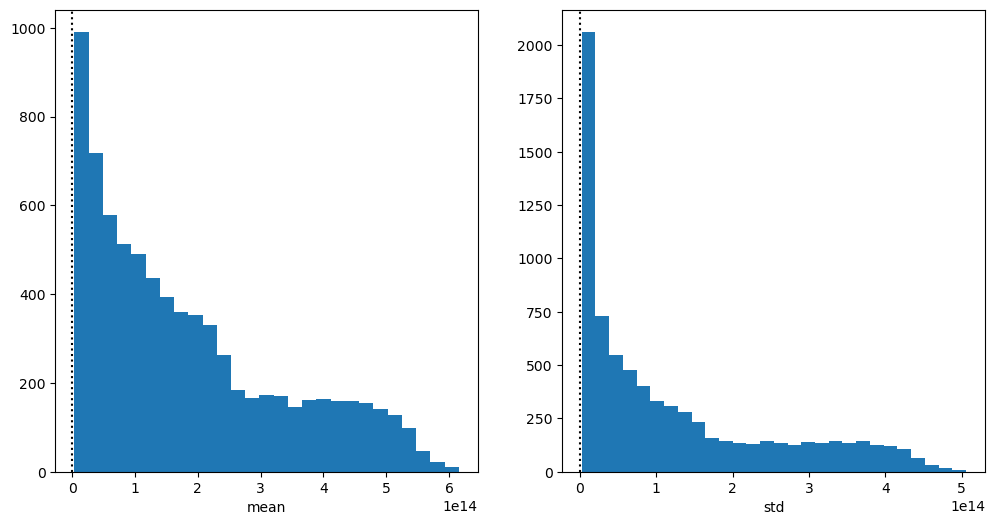

In [8]:
def stdtest(t, figsize=(12,6), lims=None, log=False):
    s = t.std(dim=-1)
    m = t.mean(dim=-1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    ax1.hist(m, bins='auto', log=log)
    ax1.axvline(0, c='k', ls=':')
    ax1.set_xlabel('mean')
    
    ax2.hist(s, bins='auto', log=log)
    ax2.axvline(1, c='k', ls=':')
    ax2.set_xlabel('std')

    if lims is not None:
        (l1, u1), (l2, u2) = lims
        ax1.set_xlim(l1, u1)
        ax2.set_xlim(l2, u2)

    return fig

stdtest(fluxes);

In [9]:
fmeans = fluxes.mean(-1)
fstds = fluxes.std(-1)

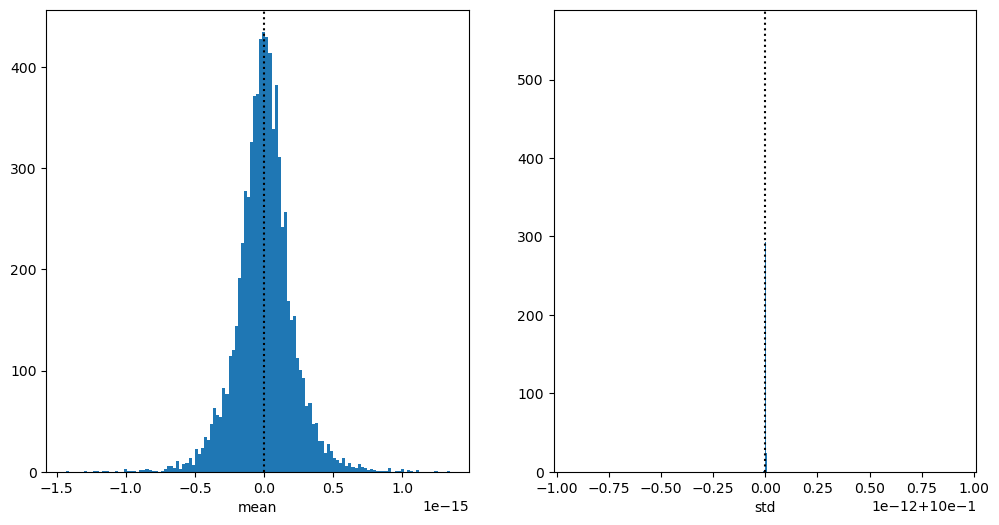

In [10]:
perfects = ((fluxes.T - fmeans)/fstds).T
stdtest(perfects);

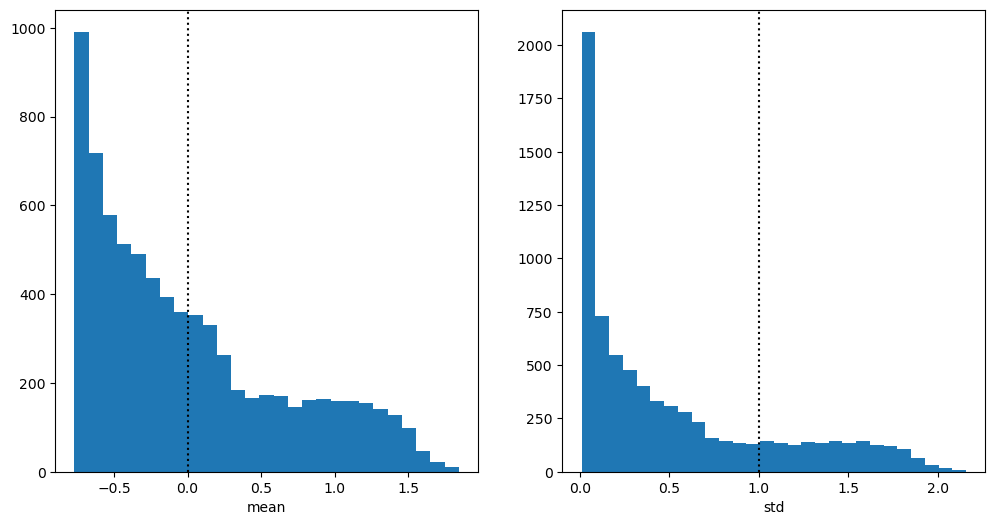

In [11]:
globalms = (fluxes - fluxes.mean())/fluxes.std()
stdtest(globalms);

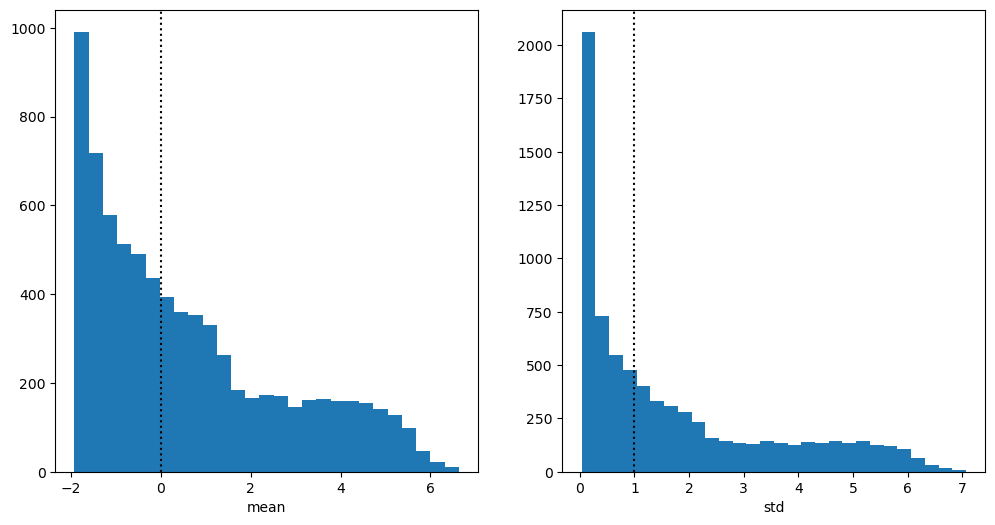

In [12]:
globalmeds = (fluxes - torch.median(fmeans))/torch.median(fstds)
stdtest(globalmeds);

# Linear Fits

/tmp/ipykernel_3756/987549616.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  lteff = np.log10(teff)


Text(0.5, 1.0, 'std')

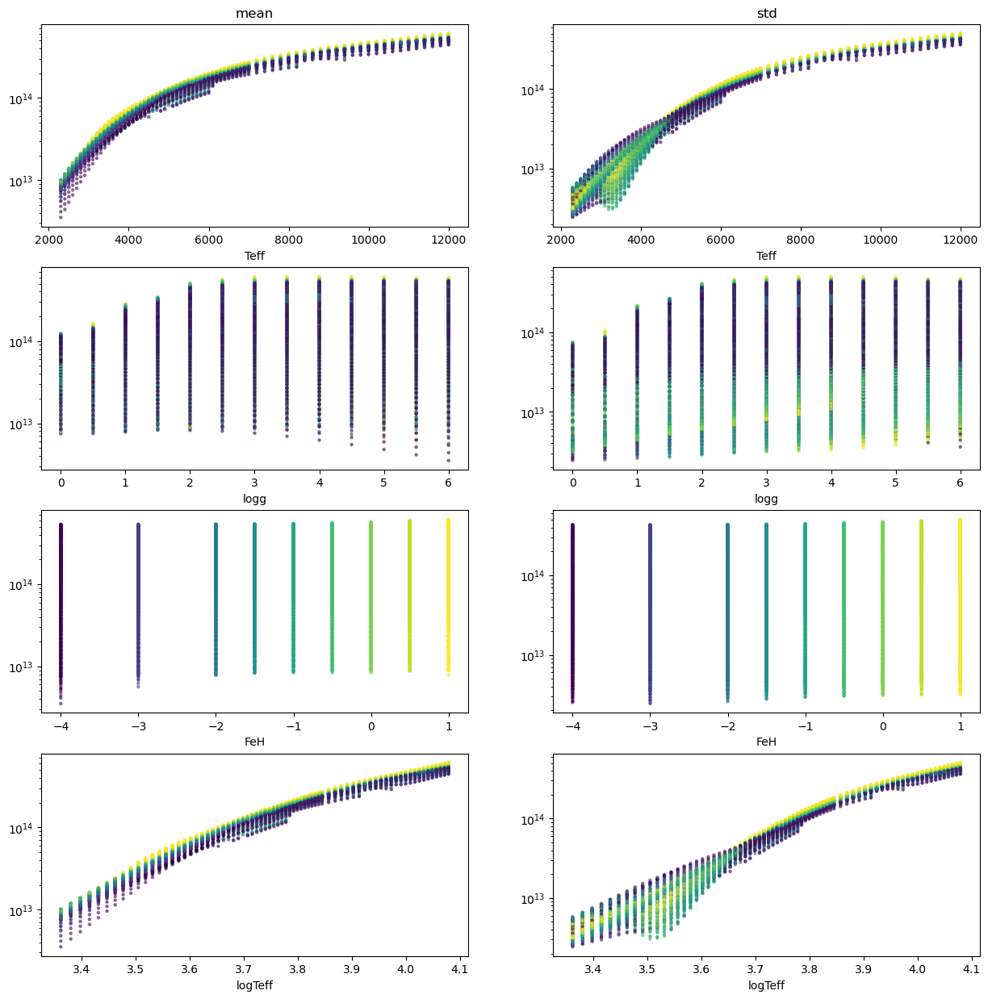

In [173]:
fig, axs = plt.subplots(4, 2, figsize=(15, 15))

for i, axrow in enumerate(axs):
    ax1, ax2 = axrow

    lteff = np.log10(teff)
    cfeat = feh

    if i == 3:
        feat = lteff
        nm = 'logTeff'
    else:
        feat = infeatures[:, i]
        nm = infeature_names[i]
    ax1.scatter(feat, fmeans, c=cfeat, alpha=.5, s=5)
    ax2.scatter(feat, fstds, c=cfeat, alpha=.5, s=5)
    ax1.set_xlabel(nm)
    ax2.set_xlabel(nm)

    ax1.semilogy()
    ax2.semilogy()
    
axs[0,0].set_title('mean')
axs[0,1].set_title('std')

Not shockingly... means go ~T^4, but std isn't awful as a linear relation either

In [174]:
logtfeatures = torch.cat((torch.log10(infeatures.T[:1]), infeatures.T[1:])).T

In [175]:
augmented = torch.cat((logtfeatures, torch.ones(logtfeatures.shape[0], 1)), dim=1).to(torch.double)

tensor([2.4378, 0.0083, 0.0179, 4.9511], dtype=torch.float64)

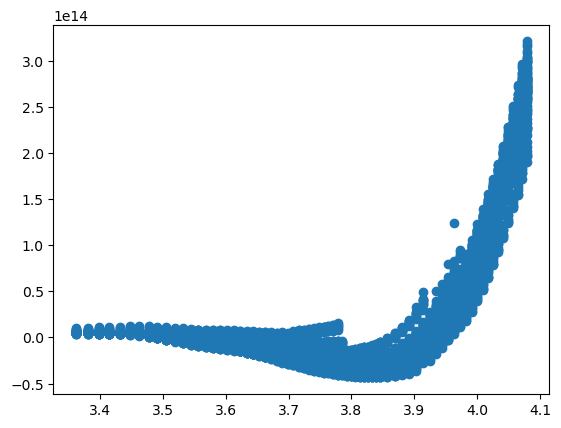

In [176]:
x = torch.linalg.lstsq(augmented, torch.log10(fmeans)).solution
pred = 10**(augmented.to(torch.double) @ x)
plt.scatter(logtfeatures[:,0], pred - fmeans)
x

tensor([ 7.4199e+14,  6.7518e+12,  5.5471e+12, -2.6023e+15],
       dtype=torch.float64)

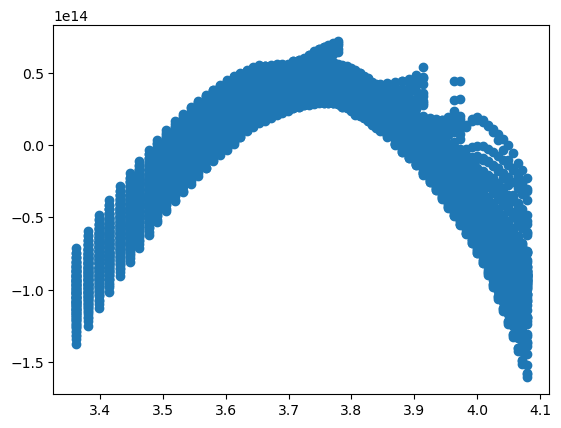

In [177]:
x = torch.linalg.lstsq(augmented, fmeans).solution
pred = augmented.to(torch.double) @ x
plt.scatter(augmented[:,0], pred - fmeans)
x

Now look at standardized versions of these to see which are the most important inputs

In [178]:
stds = augmented.std(0)
stds[-1] = 1
torch.linalg.lstsq(augmented/stds, torch.log10(fmeans)).solution

tensor([0.4692, 0.0145, 0.0275, 4.9511], dtype=torch.float64)

In [179]:
stds = augmented.std(0)
stds[-1] = 1
torch.linalg.lstsq(augmented/stds, fmeans).solution

tensor([ 1.4282e+14,  1.1815e+13,  8.5163e+12, -2.6023e+15],
       dtype=torch.float64)

Not a shock that teff is the most important, but perhaps a bit that logg is so dominant? Repeat for std

tensor([7.2545, 0.0585, 0.0148, 4.4020], dtype=torch.float64)

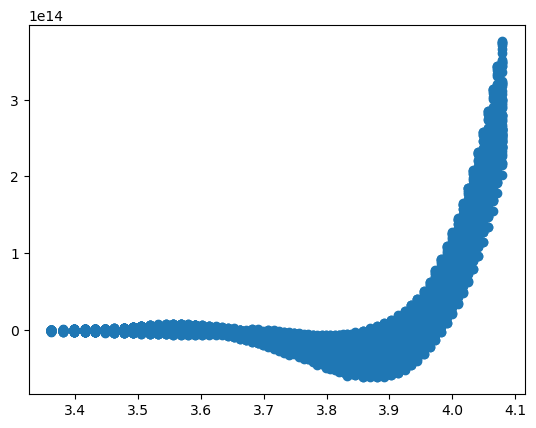

In [180]:
x = torch.linalg.lstsq(augmented, torch.log(fstds)).solution
pred = torch.exp(augmented.to(torch.double) @ x)
plt.scatter(logtfeatures[:,0], pred - fstds)
x

tensor([ 6.0391e+14,  4.7185e+12,  3.8122e+12, -2.1428e+15],
       dtype=torch.float64)

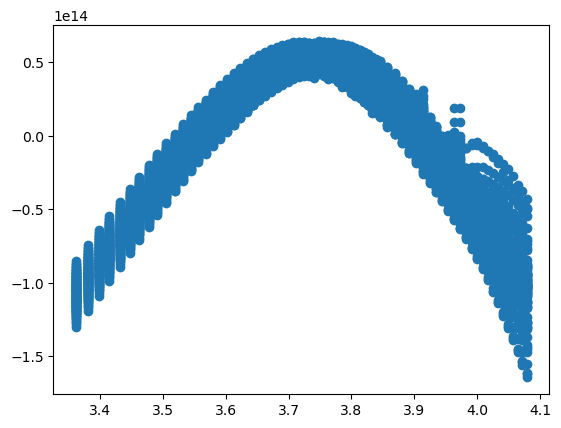

In [181]:
x = torch.linalg.lstsq(augmented, fstds).solution
pred = augmented.to(torch.double) @ x
plt.scatter(augmented[:,0], pred - fstds)
x

In [182]:
stds = augmented.std(0)
stds[-1] = 1
torch.linalg.lstsq(augmented/stds, torch.log10(fstds)).solution

tensor([0.6064, 0.0445, 0.0099, 1.9118], dtype=torch.float64)

In [183]:
stds = augmented.std(0)
stds[-1] = 1
torch.linalg.lstsq(augmented/stds, fstds).solution

tensor([ 1.1624e+14,  8.2566e+12,  5.8528e+12, -2.1428e+15],
       dtype=torch.float64)

Curious... but not shocking so lets see how well this predicts.

In [184]:
xmean = torch.linalg.lstsq(augmented, fmeans).solution
xstd = torch.linalg.lstsq(augmented, torch.log(fstds)).solution

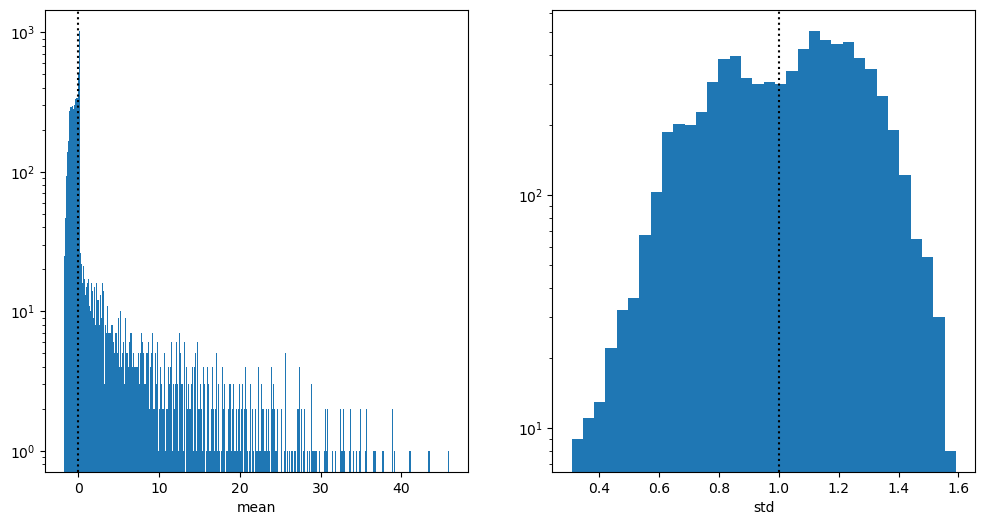

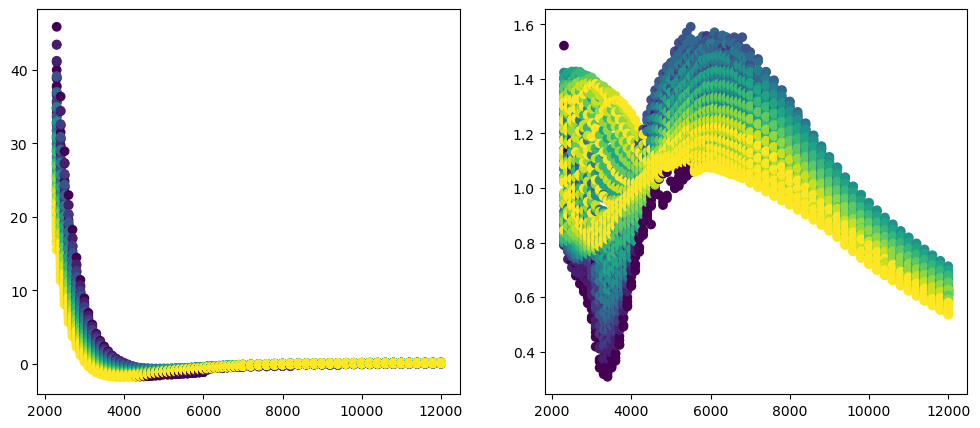

In [185]:
linpredmean = augmented @ xmean
linpredstd = torch.exp(augmented @ xstd)

linstdfluxes = ((fluxes.T - linpredmean)/linpredstd).T

stdtest(linstdfluxes, log=True);

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.scatter(teff, linstdfluxes.mean(dim=1), c=logg)
ax2.scatter(teff, linstdfluxes.std(dim=1), c=logg)

Hmm... what if we use teff instead of logteff?

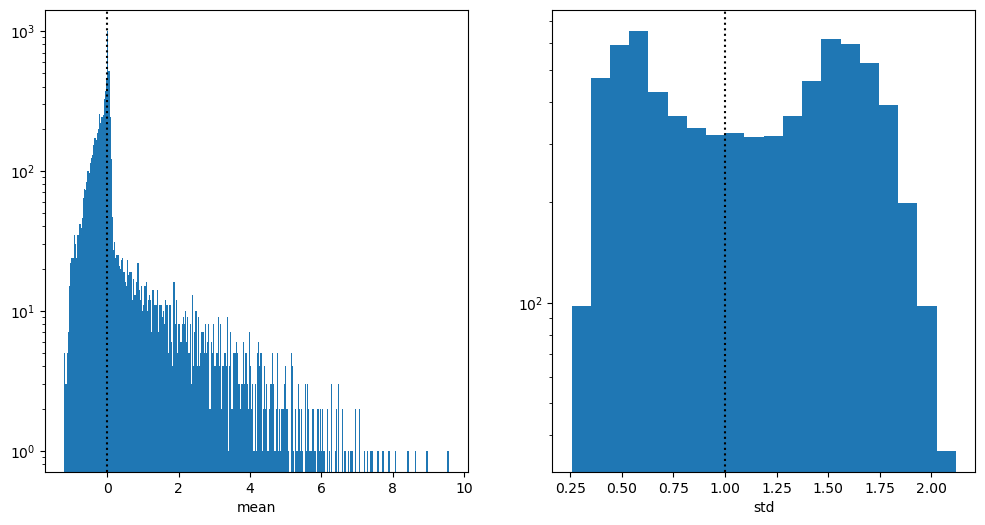

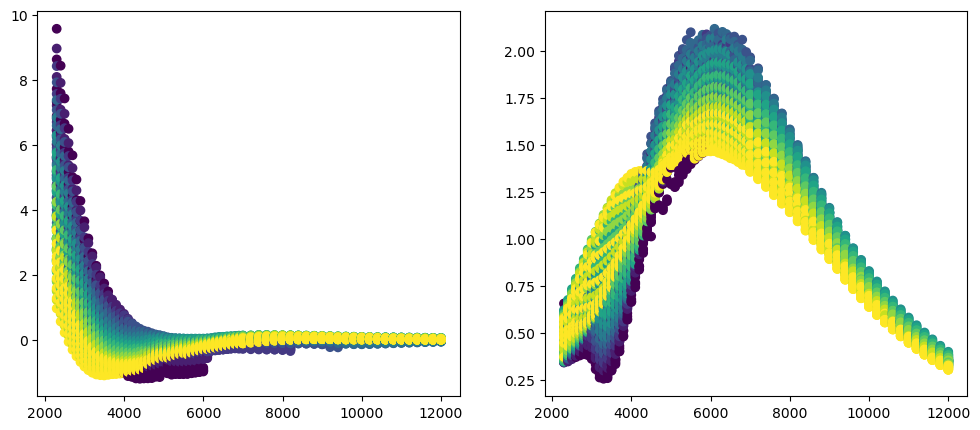

In [186]:
augmentednolog = torch.cat((infeatures, torch.ones(infeatures.shape[0], 1)), dim=1).to(torch.double)
xmean2 = torch.linalg.lstsq(augmentednolog, fmeans).solution
xstd2 = torch.linalg.lstsq(augmentednolog, torch.log(fstds)).solution

linpredmean2 = augmentednolog @ xmean2
linpredstd2 = torch.exp(augmentednolog @ xstd2)

linstdfluxes2 = ((fluxes.T - linpredmean2)/linpredstd2).T

stdtest(linstdfluxes2, log=True);

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.scatter(teff, linstdfluxes2.mean(dim=1), c=logg)
ax2.scatter(teff, linstdfluxes2.std(dim=1), c=logg)

# Blackbody

In [56]:
bbfluxes = []
for hdr in tqdm(headers):
    bb = models.BlackBody(temperature=hdr['PHXTEFF']*u.K, scale=1*u.erg/u.s * u.cm**-3 / u.sr)
    flux = bb(wl << u.angstrom)*(np.pi*u.sr)
    bbfluxes.append(flux.to(u.erg/u.s * u.cm**-3).value)
bbfluxes = torch.from_numpy(np.array(bbfluxes))

  0%|          | 0/7508 [00:00<?, ?it/s]

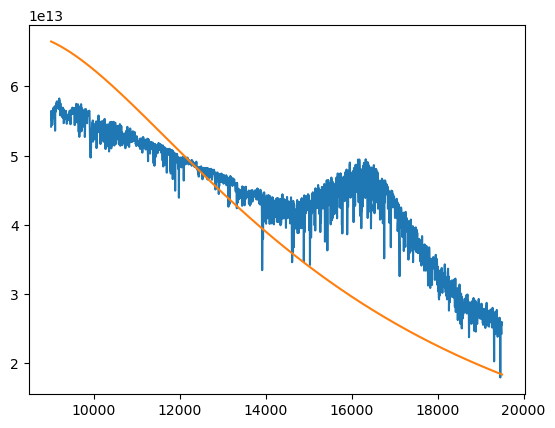

In [57]:
idx = np.random.randint(fluxes.shape[0])

plt.plot(wl, fluxes[idx])
plt.plot(wl, bbfluxes[idx])

tensor(0.9622, dtype=torch.float64)

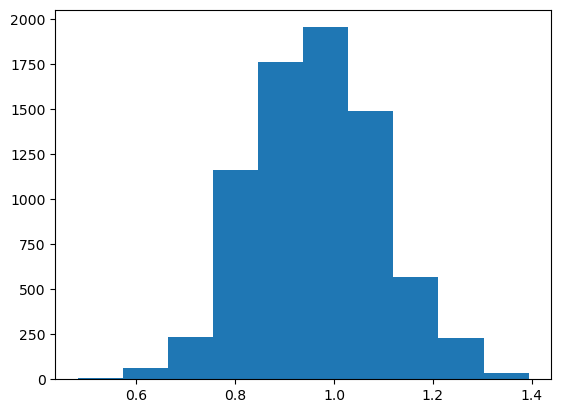

In [58]:
plt.hist(fluxes.mean(1)/bbfluxes.mean(1))
(fluxes.mean(1)/bbfluxes.mean(1)).mean()

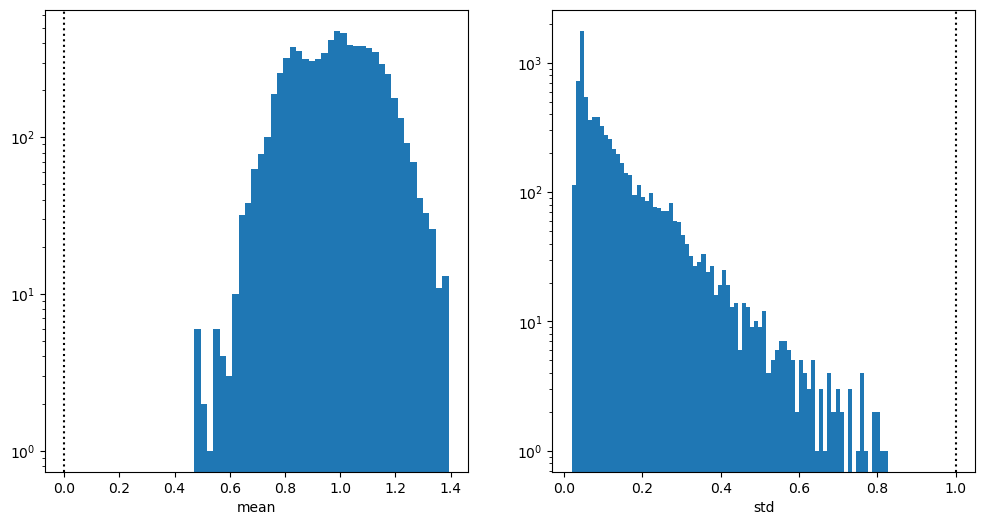

In [59]:
bbscaledfluxes = fluxes/bbfluxes
stdtest(bbscaledfluxes, log=True);

(5060, tensor(0.0513, dtype=torch.float64))

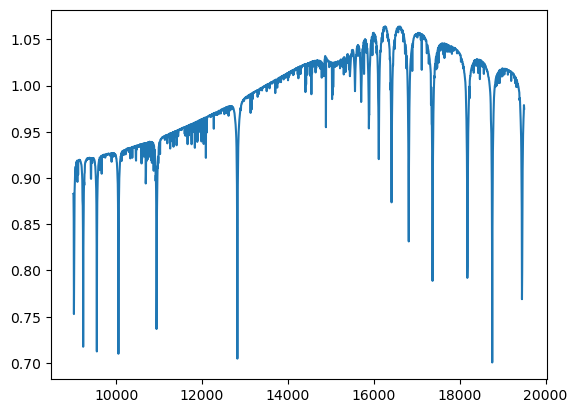

In [60]:
idx = np.random.randint(fluxes.shape[0])

plt.plot(wl, bbscaledfluxes[idx])
idx, bbscaledfluxes[idx].std()

If we now scale by global values?

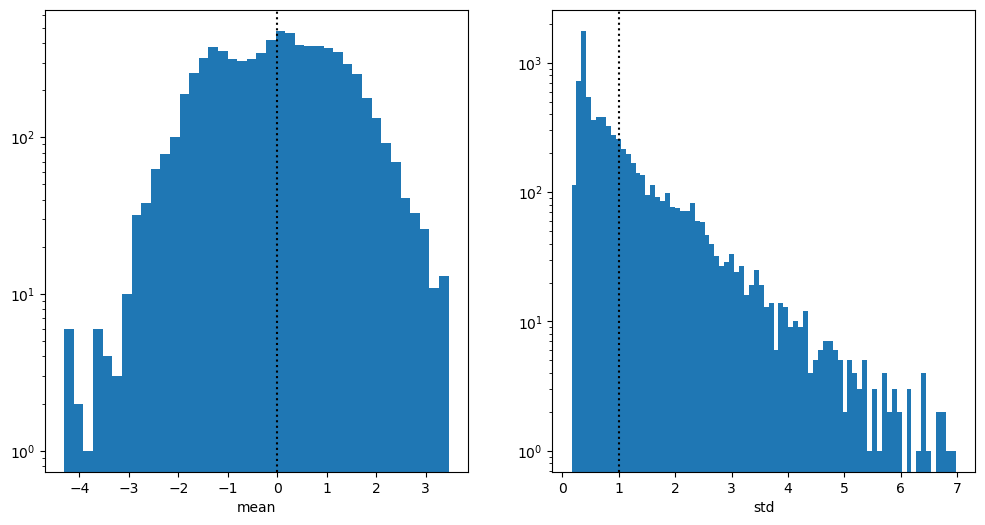

In [61]:
bbscaledmean = bbscaledfluxes.mean()
bbscaledstd = bbscaledfluxes.std(dim=1)
bbscaledstdm = bbscaledstd.mean()

bbscaledfluxes2 = (bbscaledfluxes - bbscaledmean)/bbscaledstdm
stdtest(bbscaledfluxes2, log=True);

What about just dividing by the bb mean flux?

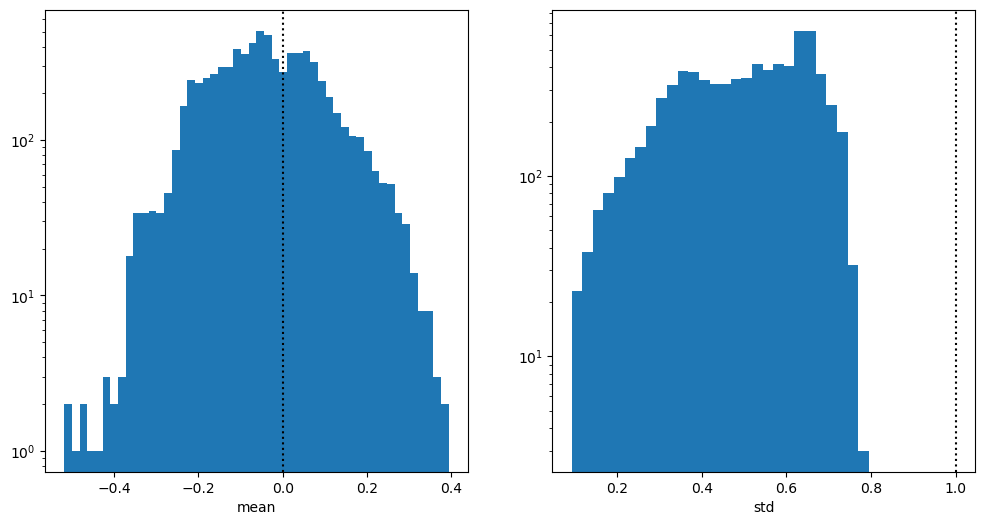

In [68]:
bbmean = bbfluxes.mean(dim=-1)

bbsimplescale = fluxes/bbmean[...,None] - 1
stdtest(bbsimplescale, log=True);

# Autoencoder tests

See [ml_gen_parameters_2k_autoencoder.ipynb](ml_gen_parameters_2k_autoencoder.ipynb) for preliminaries on this

In [44]:
class Encoder(nn.Module):
    def __init__(self, npix, nneurons, activation_cls):
        super().__init__()

        prev_layern = npix
        stack = []
        for nneur in nneurons:
            stack.append(nn.Linear(prev_layern, nneur))
            stack.append(activation_cls())
            prev_layern = nneur
            
        self.stack = nn.Sequential(*stack)

    @property
    def device(self):
        return next(self.parameters()).device         

    @property
    def dtype(self):
        return next(self.parameters()).dtype
        
    @property
    def npix(self):
        return self.stack[0].num_features
        
    @property
    def latent_size(self):
        return self.stack[-1].num_features
        
    def forward(self, x):
        return self.stack(x)

class Decoder(nn.Module):
    def __init__(self, npix, nneurons, activation_cls):
        super().__init__()

        prev_layern = nneurons[0]
        stack = []
        for nneur in nneurons[1:]:
            stack.append(nn.Linear(prev_layern, nneur))
            stack.append(activation_cls())
            prev_layern = nneur
        stack.append(nn.Linear(prev_layern, npix))
            
        self.stack = nn.Sequential(*stack)

    @property
    def device(self):
        return next(self.parameters()).device         

    @property
    def dtype(self):
        return next(self.parameters()).dtype
        
    @property
    def npix(self):
        return self.stack[-1].num_features
        
    @property
    def latent_size(self):
        return self.stack[0].num_features
        
    def forward(self, x):
        return self.stack(x)
        
class Autoencoder(nn.Module):
    def __init__(self, npix, nneurons, activation_cls=nn.GELU):
        super().__init__()

        self.encoder = Encoder(npix, nneurons, activation_cls)
        self.decoder = Decoder(npix, nneurons[::-1], activation_cls)

    @property
    def device(self):
        return next(self.parameters()).device         

    @property
    def dtype(self):
        return next(self.parameters()).dtype
        
    @property
    def npix(self):
        return self.encoder.stack[0].num_features
        
    @property
    def latent_size(self):
        return self.encoder.stack[-1].num_features
        
    def forward(self, x):
        x = torch.atleast_2d(x)
        latent = self.encoder(x)
        return self.decoder(latent)

aec = Autoencoder(fluxes.shape[-1], [100, 10])
aec

Autoencoder(
  (encoder): Encoder(
    (stack): Sequential(
      (0): Linear(in_features=2048, out_features=100, bias=True)
      (1): GELU(approximate='none')
      (2): Linear(in_features=100, out_features=10, bias=True)
      (3): GELU(approximate='none')
    )
  )
  (decoder): Decoder(
    (stack): Sequential(
      (0): Linear(in_features=10, out_features=100, bias=True)
      (1): GELU(approximate='none')
      (2): Linear(in_features=100, out_features=2048, bias=True)
    )
  )
)

In [45]:
def train_validation(model, dataset, nepochs, batch_size, lr, ttsplit=[.3, .7], inner_validation=False, weight_decay=0, eps=1e-8, loss_fcn=nn.MSELoss(), scheduler_fcn=None):
    split_data = random_split(dataset, ttsplit, torch.Generator().manual_seed(42))
    valid_data, train_data = split_data
    valid_X, valid_Y = valid_data.dataset.tensors[:2]
    
    valid_losses = []
    valid_niters = []

    train_losses = []
    train_niters = []

    lrs = []
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay, eps=eps)
    if scheduler_fcn is not None:
        scheduler = scheduler_fcn(optimizer)
    
    niters = 0

    def validation_fcn():
        model.eval()
        with torch.no_grad():
            pred = model(valid_X)
            valid_loss = loss_fcn(pred,valid_Y).item()
            valid_losses.append(valid_loss)
            valid_niters.append(niters)
        return valid_loss
    
    for _ in (pbar := tqdm(range(nepochs))):
        model.train()
    
        for data in DataLoader(train_data, batch_size=batch_size, shuffle=True):
            X, Y = data[:2]
            optimizer.zero_grad()
            
            pred = model(X)
            loss = loss_fcn(pred, Y)
            
            loss.backward()
            optimizer.step()
    
            niters += X.shape[0]
            
            train_losses.append(loss.item())
            train_niters.append(niters)

            if inner_validation:
                valid_loss = validation_fcn()
                
                if scheduler_fcn is not None:
                    scheduler.step()
                    lrs.append(scheduler.get_last_lr())
            
        if not inner_validation:
            if scheduler_fcn is not None:
                scheduler.step()
                lrs.append(scheduler.get_last_lr())
                
            valid_loss = validation_fcn()
                
        if scheduler_fcn is None:
            pbar.set_description(f'valid loss={valid_loss:.3e}')
        else:
            pbar.set_description(f'valid loss={valid_loss:.3e}, lr={lrs[-1][0]:.3e}')
            
    if scheduler_fcn is None:
        return (valid_niters, valid_losses), (train_niters, train_losses), split_data
    else:
        return (valid_niters, valid_losses), (train_niters, train_losses), lrs, split_data

In [46]:
def plot_sample_specs(model, data_split, descaler=None):
    valid_data, train_data = data_split
    valid_idxs = np.random.randint(len(valid_data), size=5)

    figs = []
    for valid_idx in valid_idxs:
        Xi, Yi, infeaturesi = [xy[valid_data.indices[valid_idx]] for xy in valid_data.dataset.tensors]
        
        pred = model(Xi[None,...])[0].detach()

        if descaler is not None:
            pred = descaler(pred, infeaturesi)
            Yi = fluxes[np.array(valid_data.indices[valid_idx])]
            
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        figs.append(fig)
        ax1, ax2 = axs
        
        ax1.plot(wl, Yi.cpu(), lw=1, label='true')
        ax1.plot(wl, pred.cpu(), lw=1, label='predicted', alpha=.5)
        ax1.legend(loc=0)
        ax1.set_title(f'{valid_idx}')
        
        msk = (14000<wl)&(wl<15000)
        ax2.plot(wl[msk], Yi[msk].cpu(), lw=1, label='true')
        ax2.plot(wl[msk], pred[msk].cpu(), lw=1, label='predicted', alpha=.5)
        ax2.legend(loc=0)
        ax2.set_title(f'{valid_idx} - zoom')
        
    return valid_idxs, figs

In [47]:
#nneurons_test = 2048//(4**np.arange(4)[1:])
nneurons_test = 2048//(2**np.arange(7)[1:])
nneurons_test

array([1024,  512,  256,  128,   64,   32])

In [71]:
nperrestart = 4000
nrestarts = 3
lr = 1e-4
wd = 1e-4

## Global medians

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([1702,  147,  795,  979,   85]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

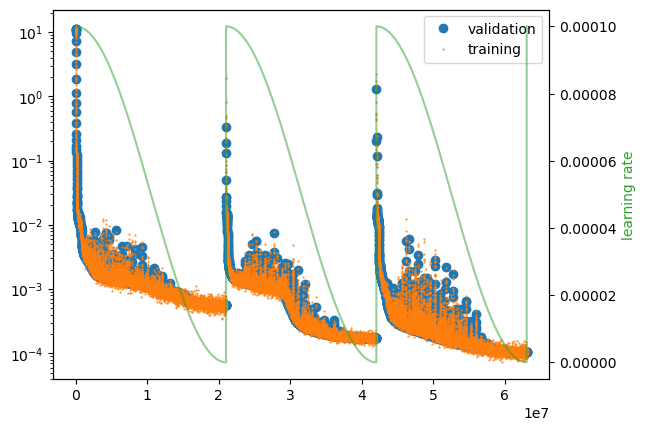

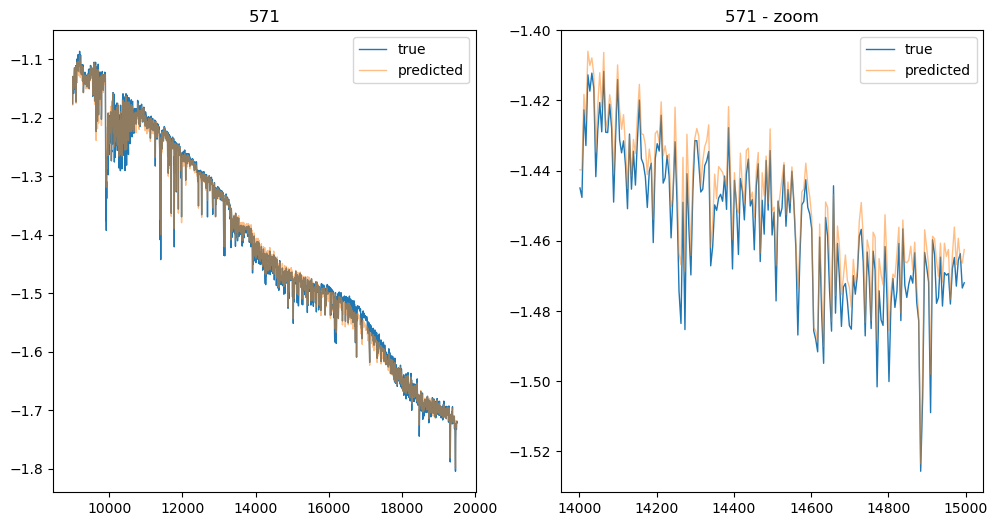

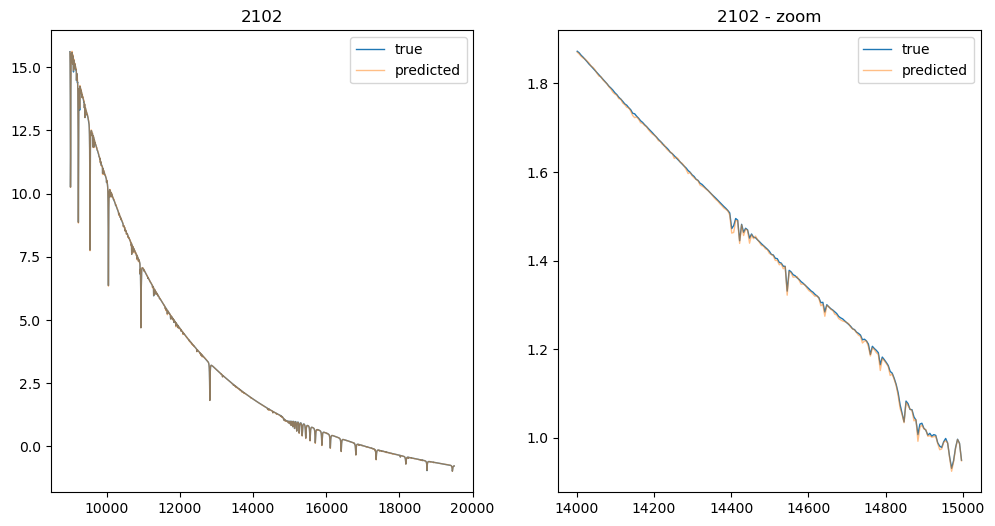

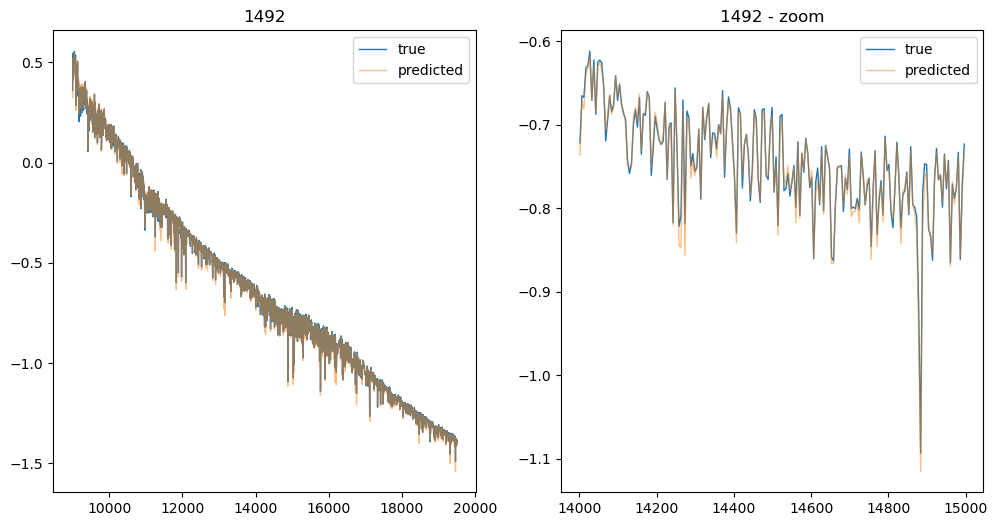

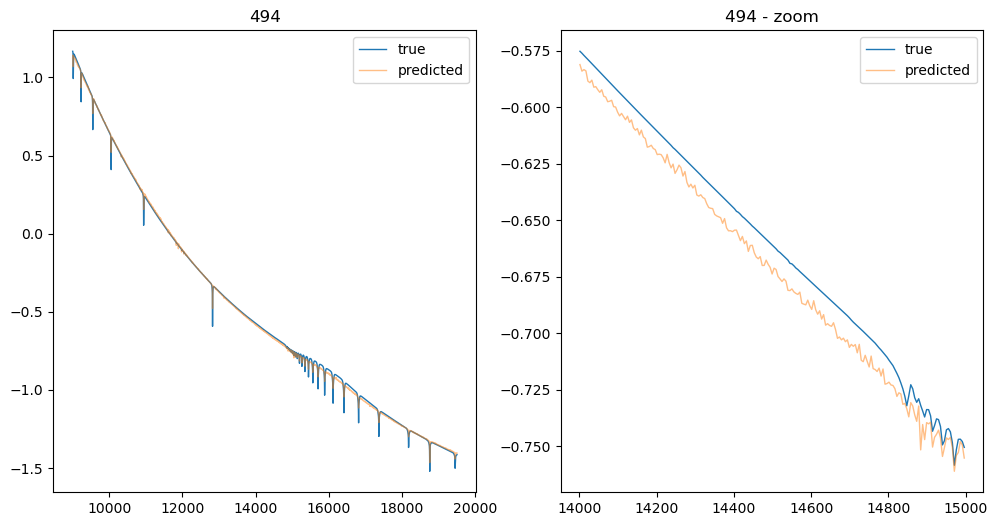

...

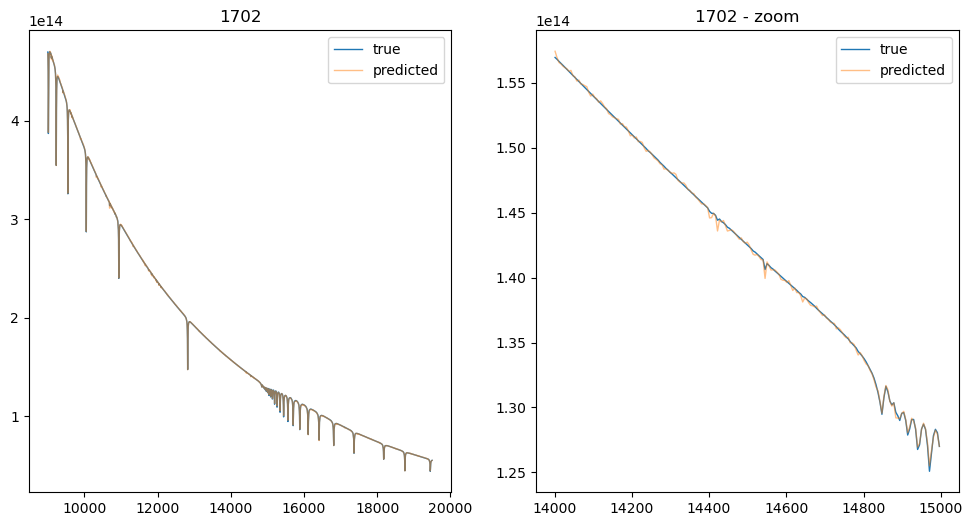

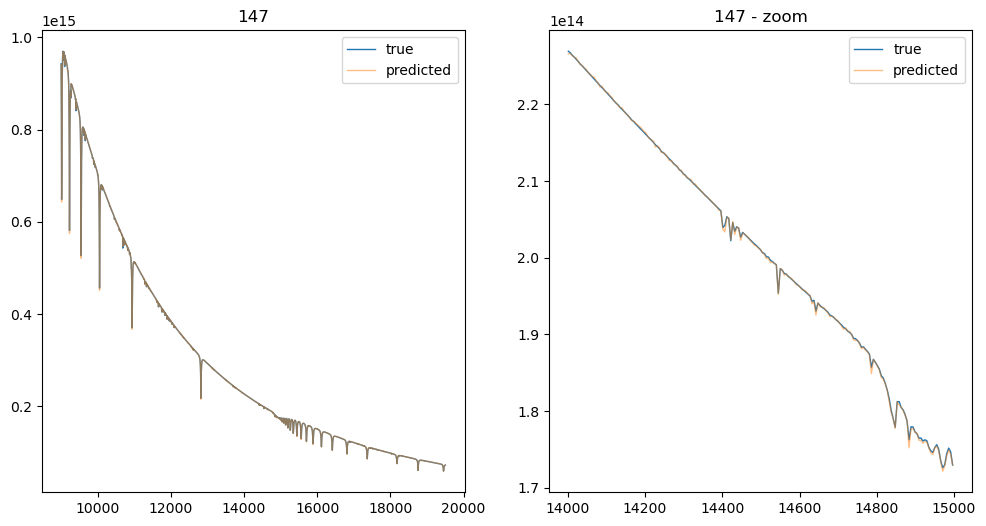

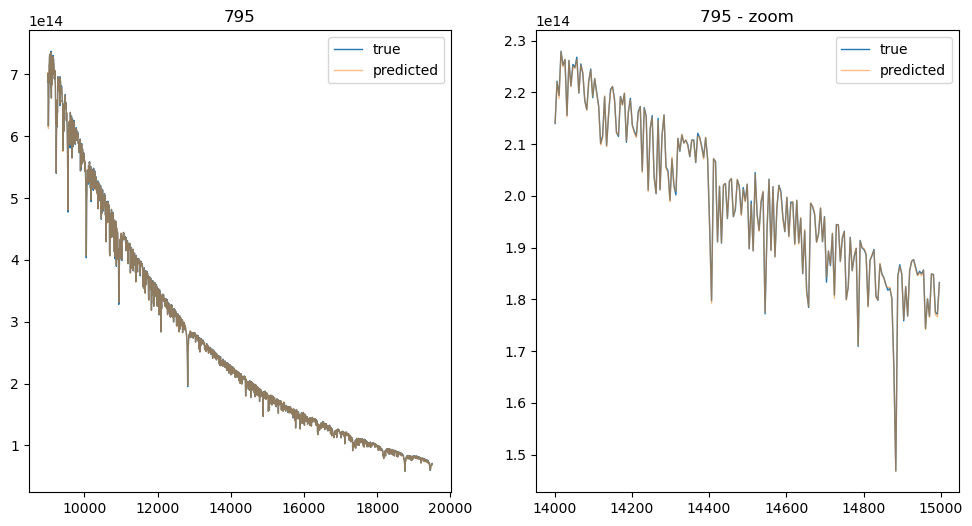

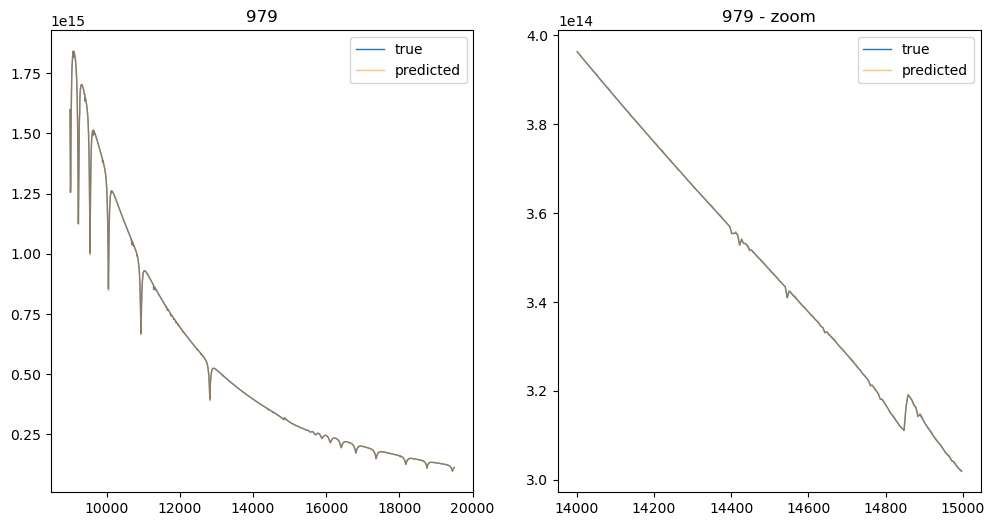

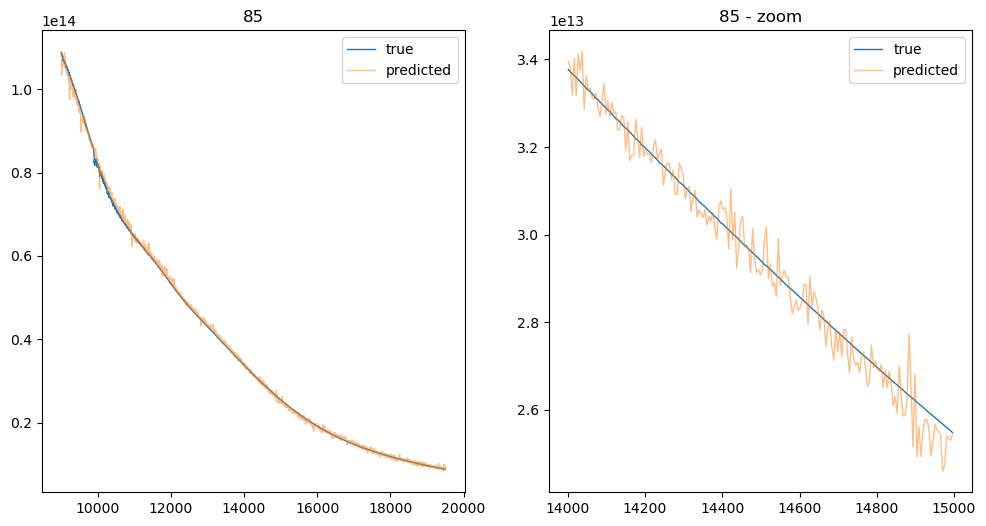

In [685]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(globalmeds.to(device, tensor_dtype), globalmeds.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    return y*s + m
plot_sample_specs(model, data_split, descaler)

## Linear fit with logTeff

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([ 788,  675,  157, 1164,  194]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

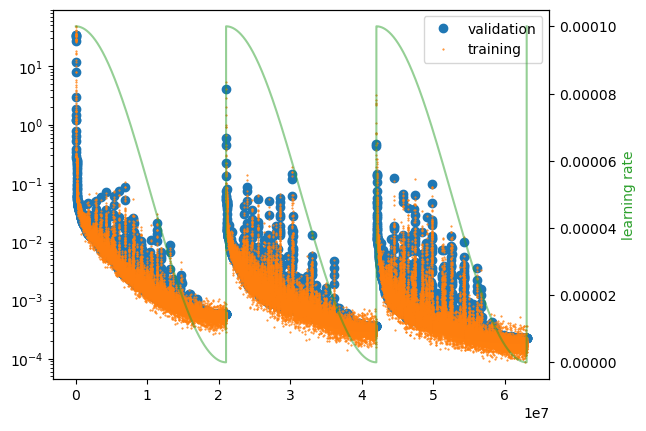

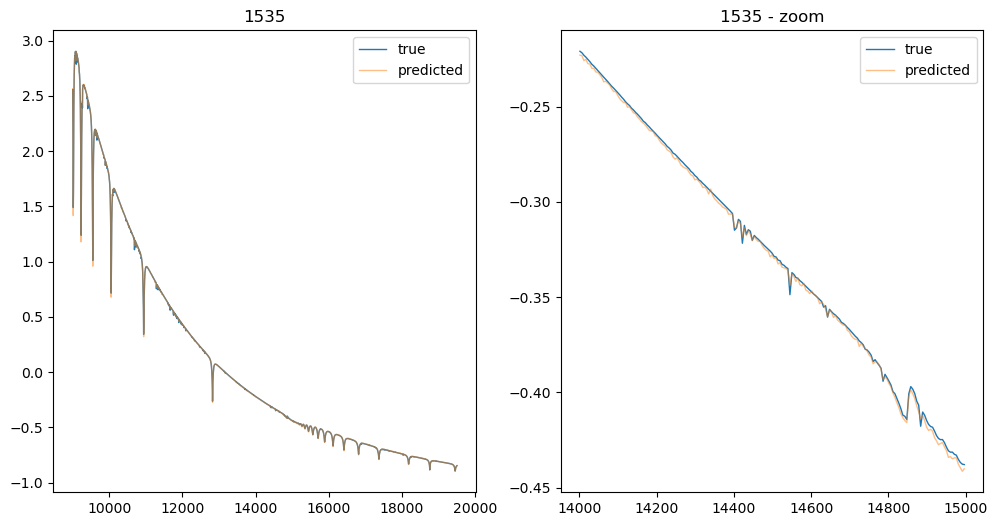

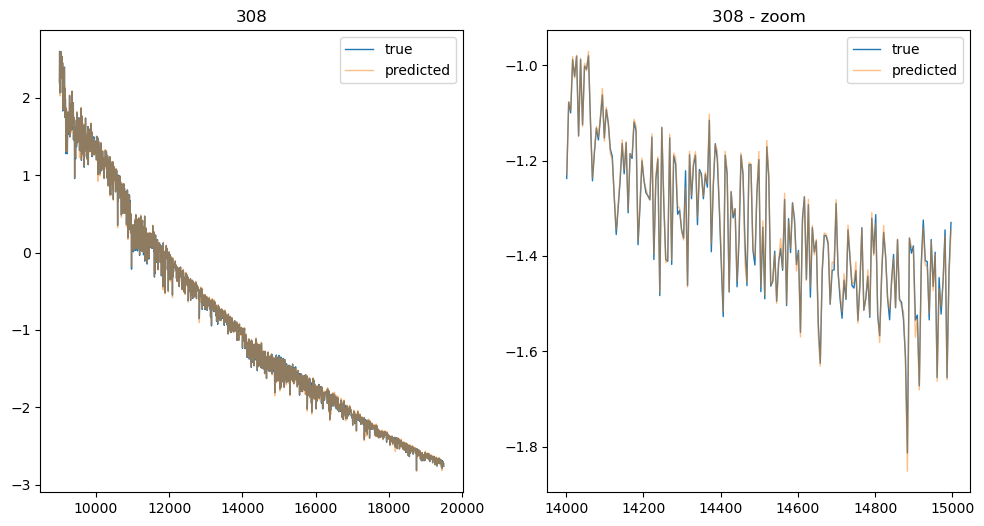

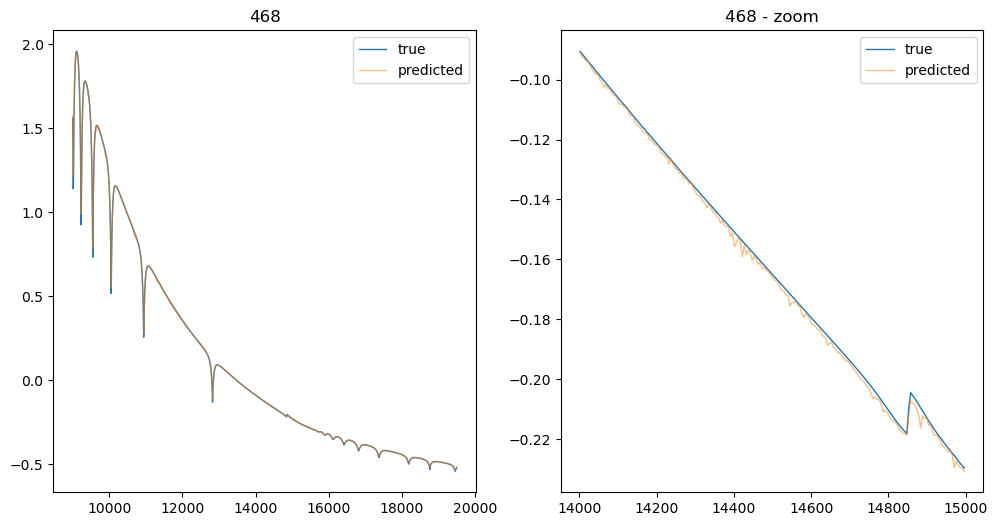

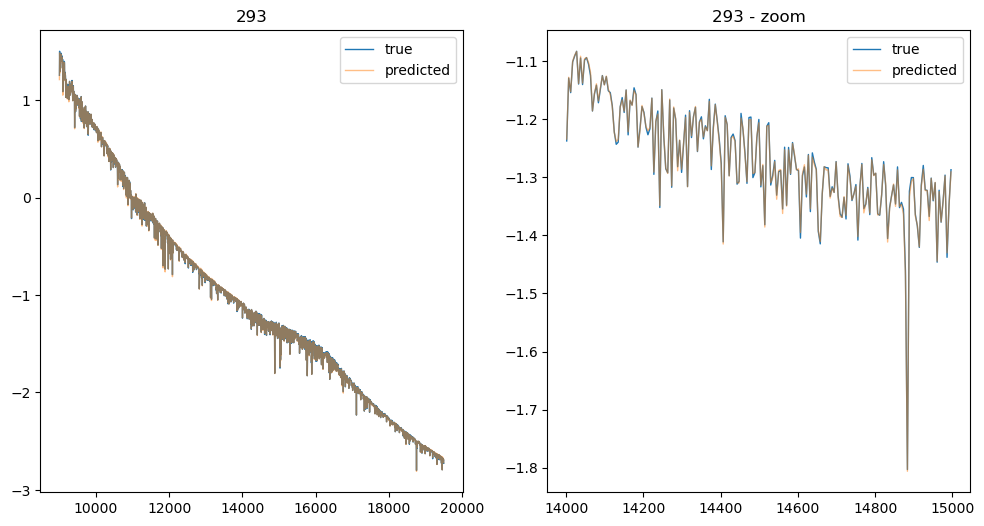

...

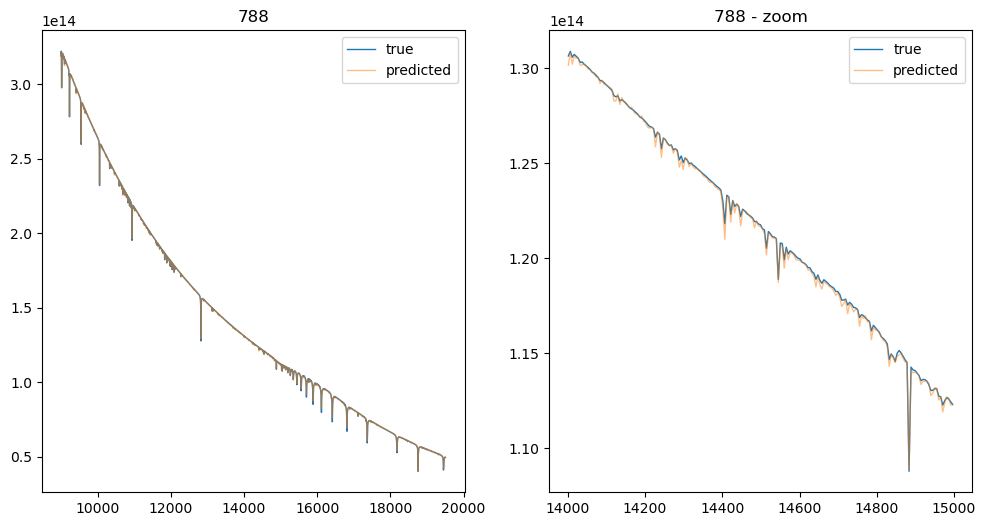

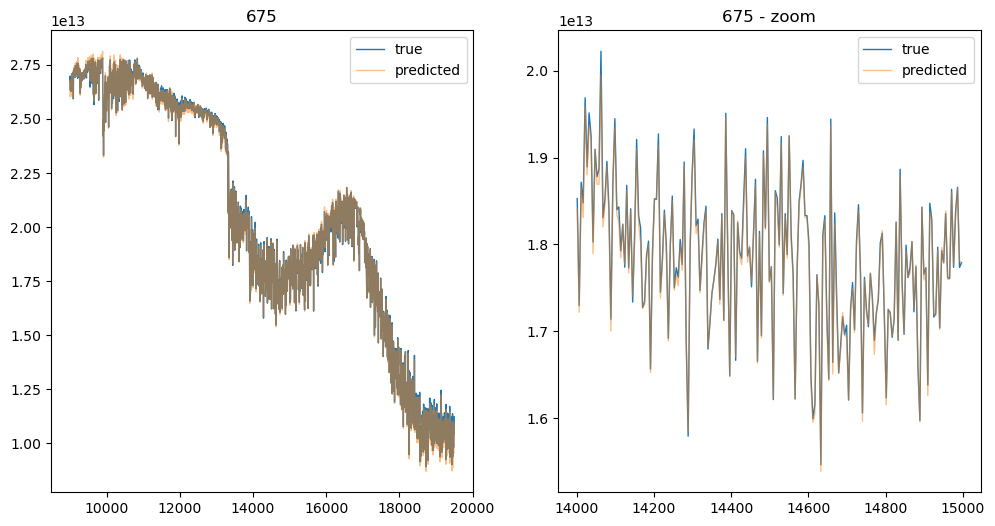

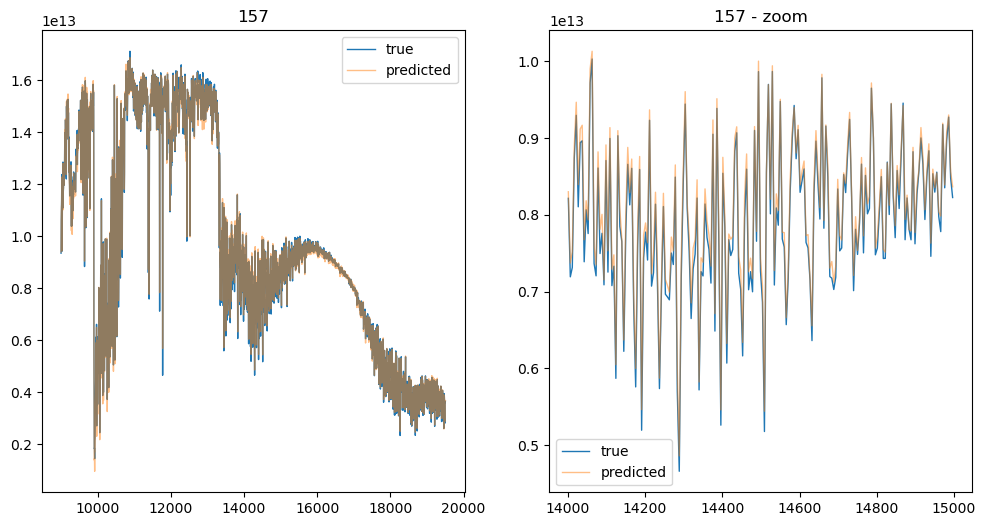

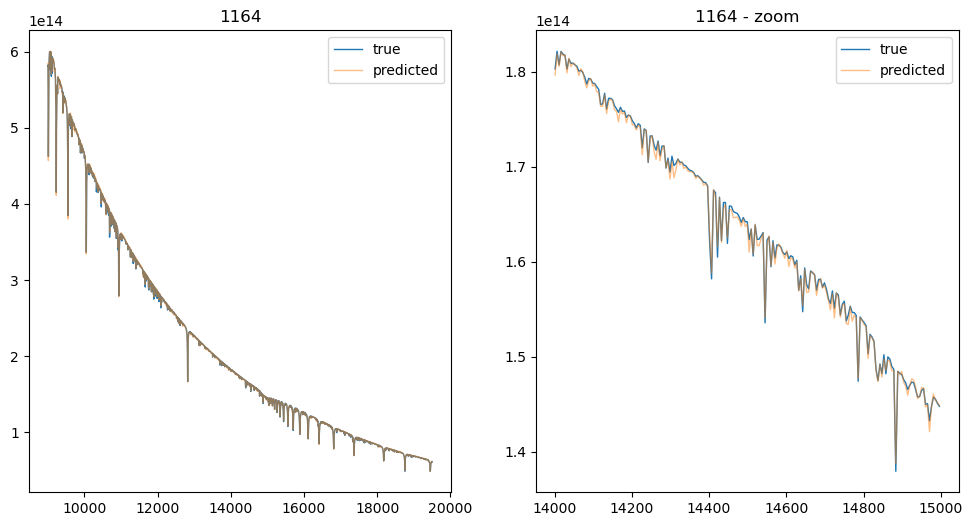

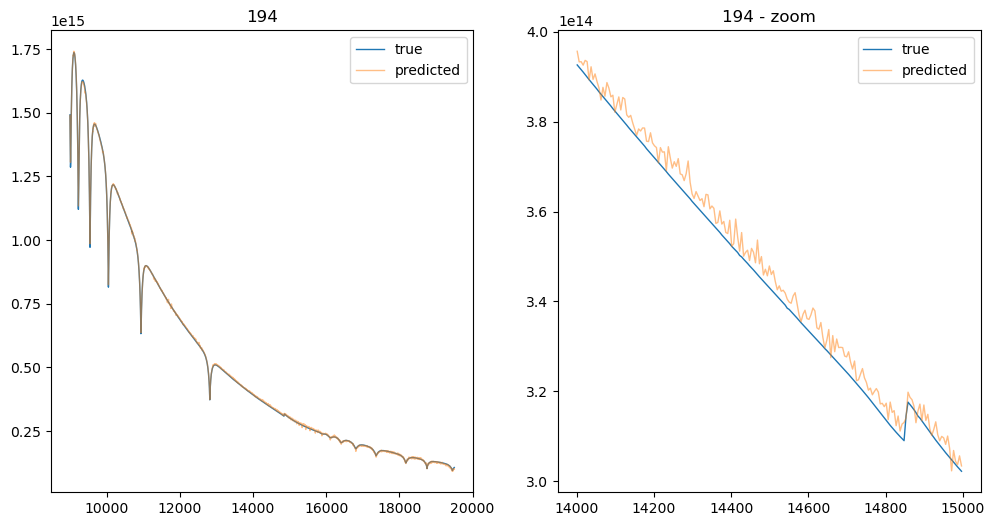

In [686]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(linstdfluxes.to(device, tensor_dtype), linstdfluxes.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures):
    infs = infeatures.to(xmean.device, xmean.dtype)
    infs[0] = torch.log10(infs[0])
    m = torch.cat((infs, torch.ones(1))) @ xmean
    s = torch.exp(torch.cat((infs, torch.ones(1))) @ xstd)
    return y*s + m
    
plot_sample_specs(model, data_split, descaler)

## Linear fit with Teff

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([ 835,   57,  548, 1795, 1230]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

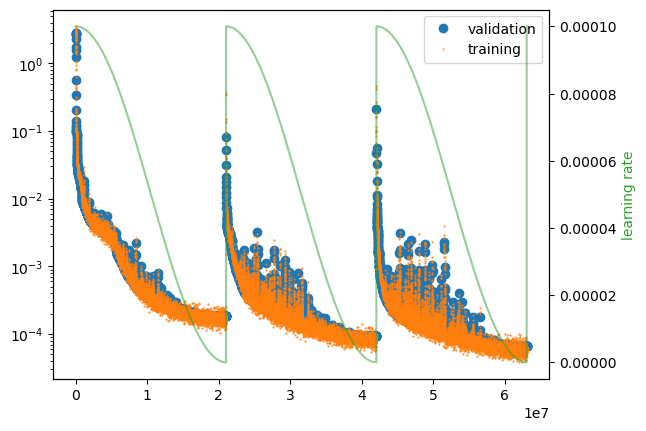

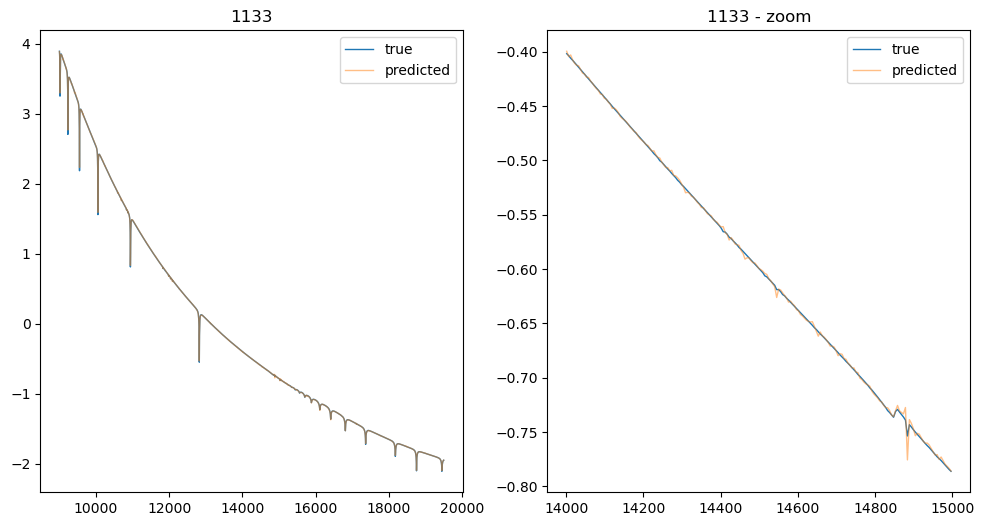

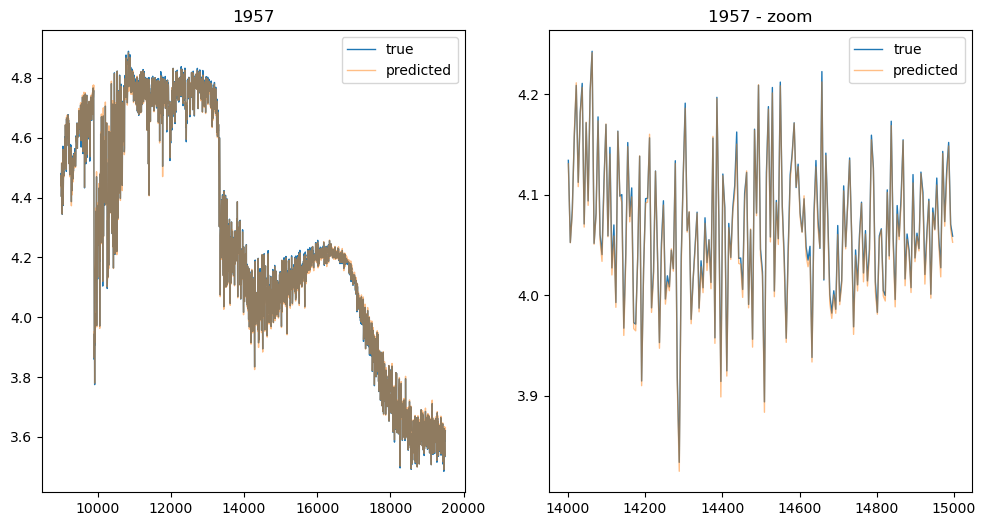

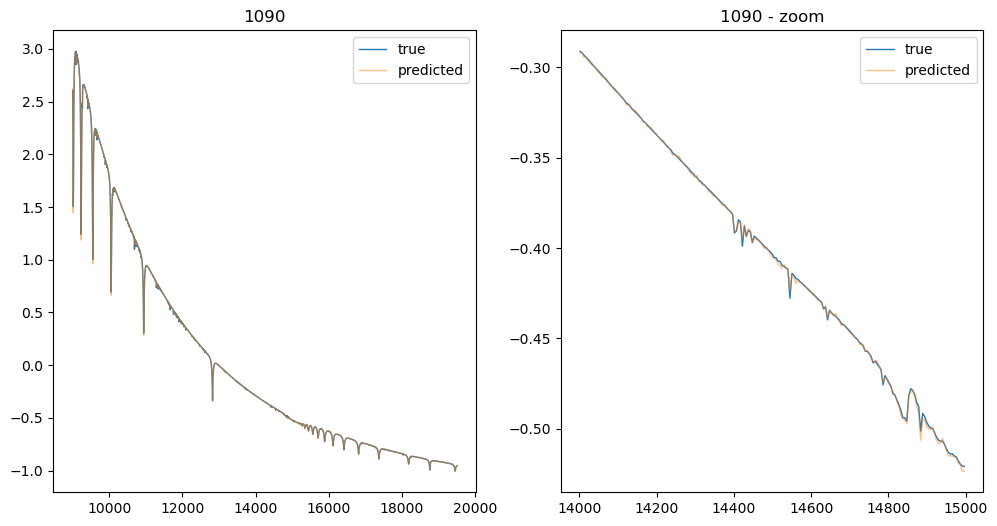

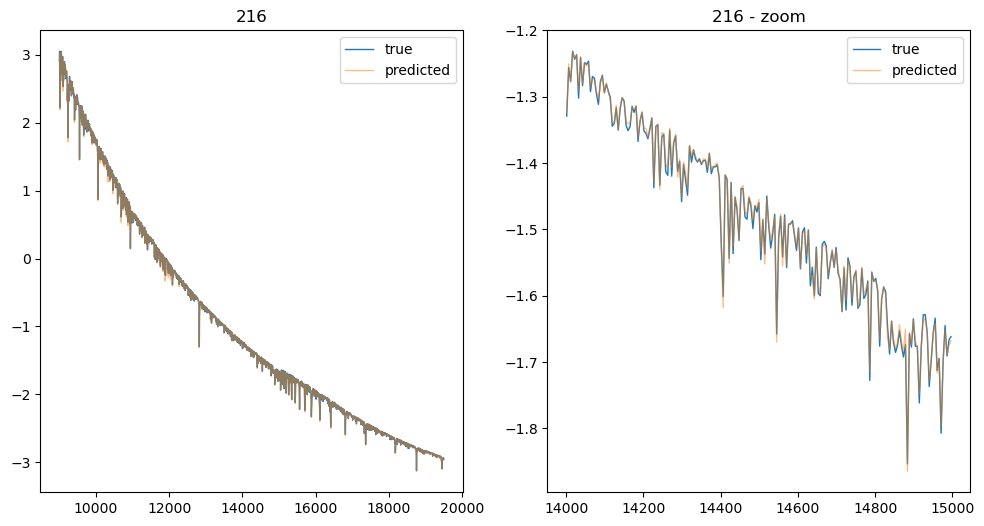

...

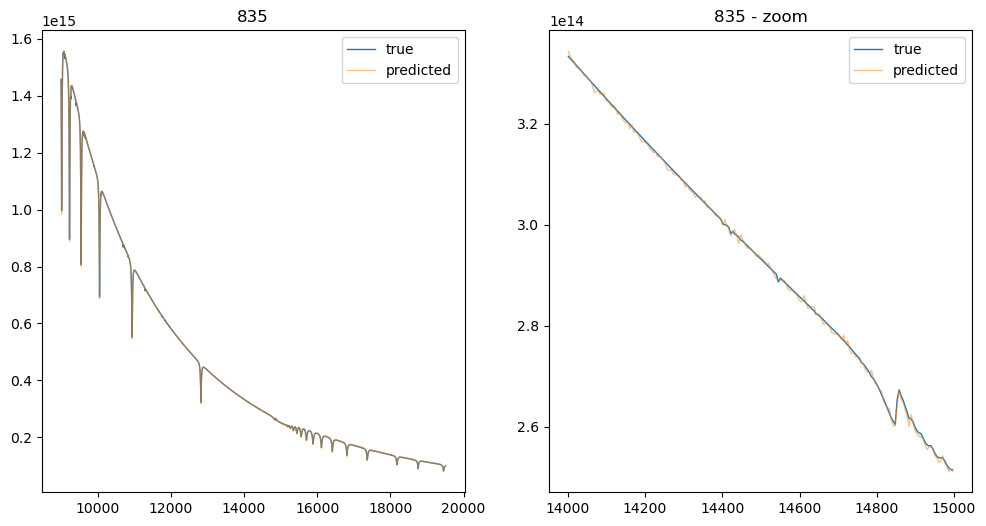

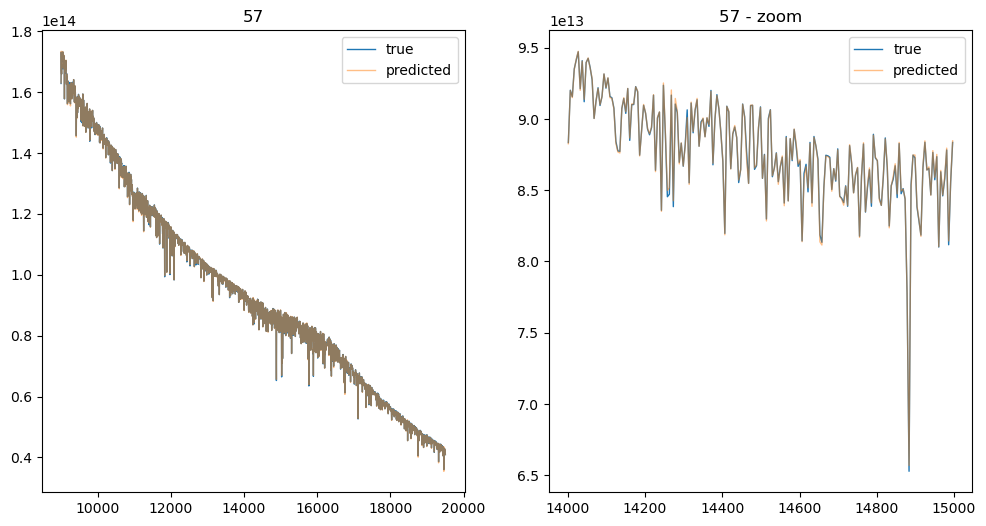

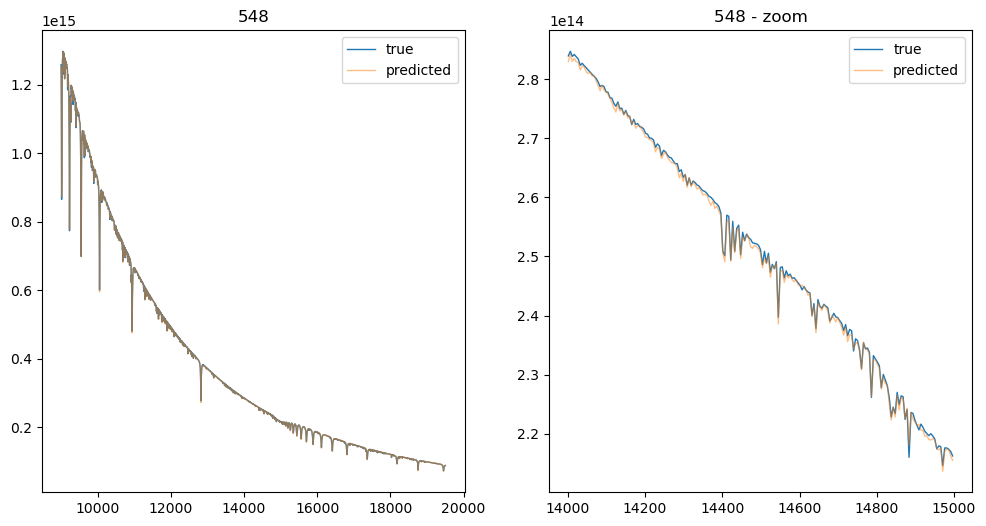

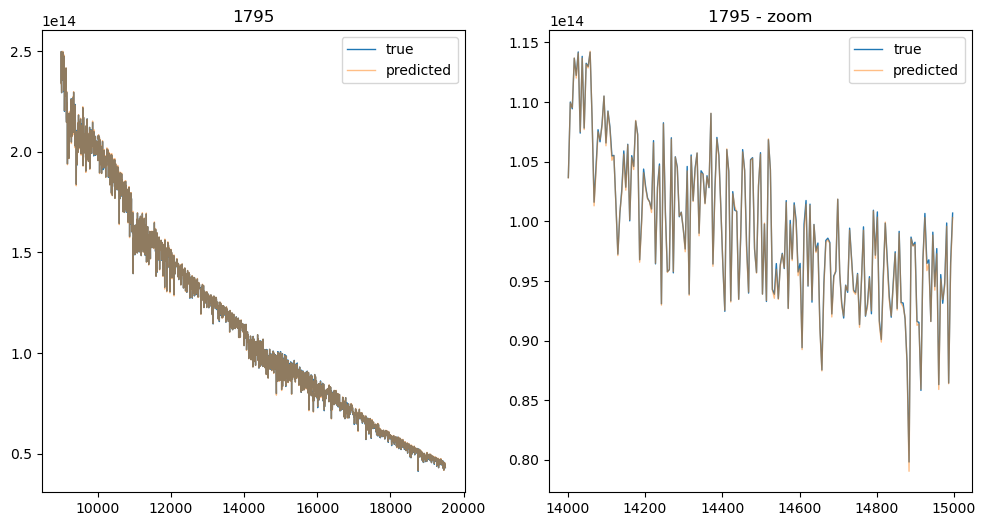

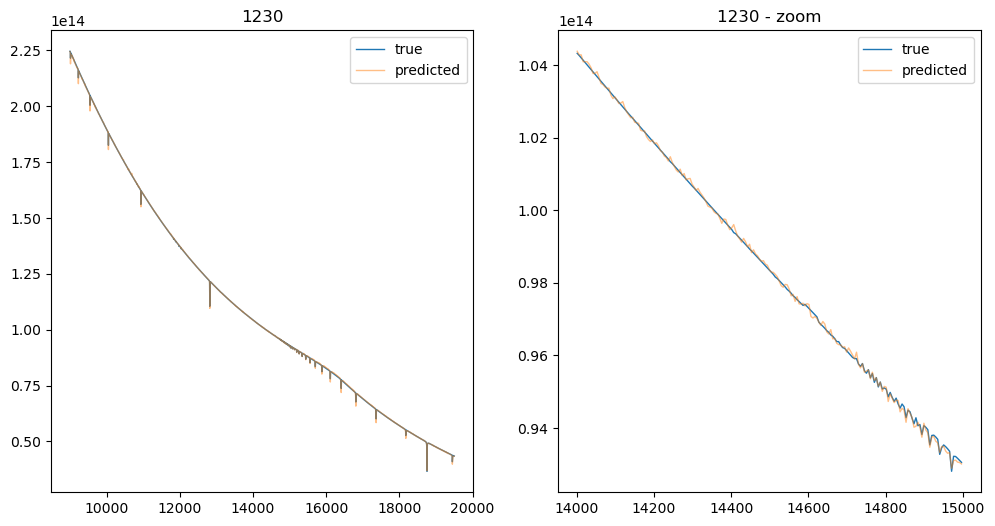

In [687]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(linstdfluxes2.to(device, tensor_dtype), linstdfluxes2.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures):
    infs = infeatures.to(xmean2.device, xmean2.dtype)
    m = torch.cat((infs, torch.ones(1))) @ xmean2
    s = torch.exp(torch.cat((infs, torch.ones(1))) @ xstd2)
    return y*s + m
    
plot_sample_specs(model, data_split, descaler)

## Linear fit with BB normalization

  0%|          | 0/12000 [00:00<?, ?it/s]

/tmp/ipykernel_8176/2793982038.py:29: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return y.cpu()*bbflux


(array([1192, 1584, 1945, 1542, 1320]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

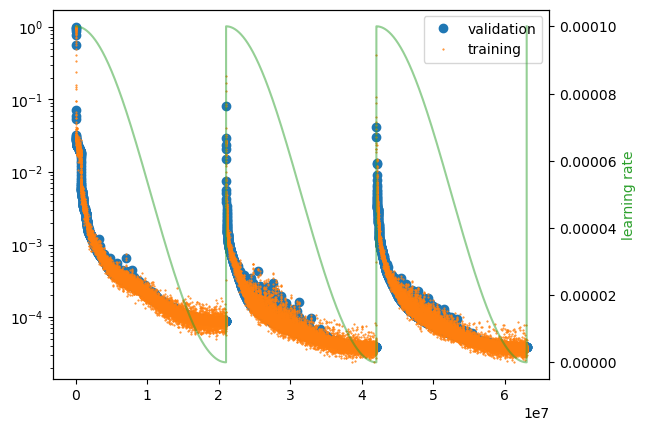

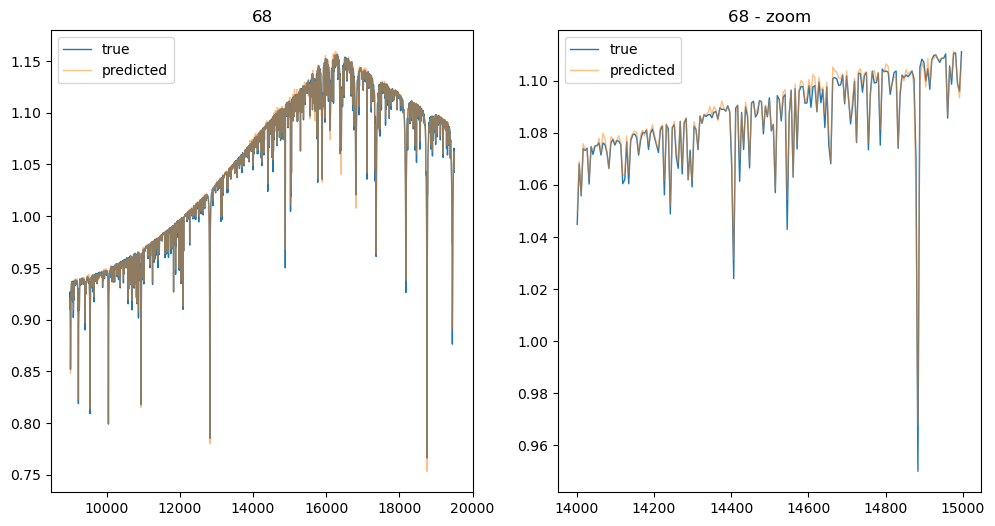

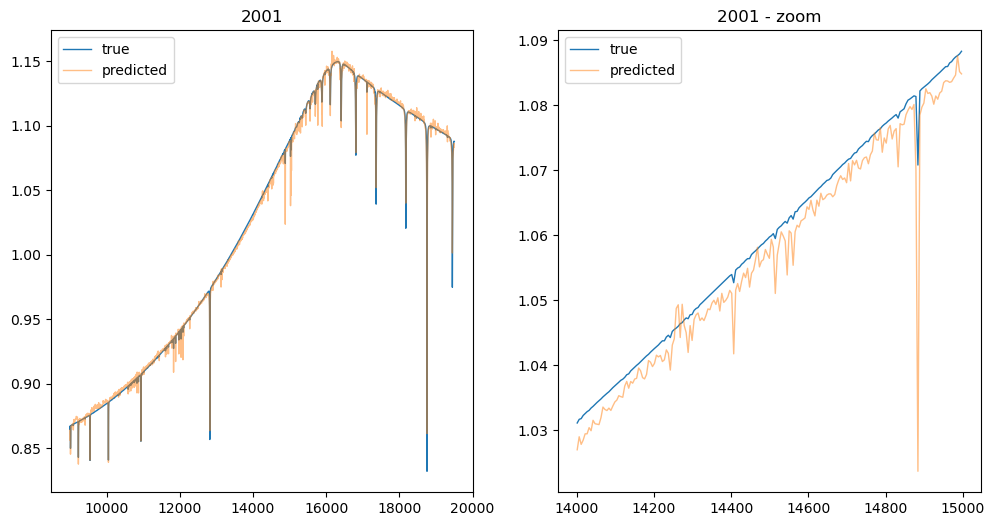

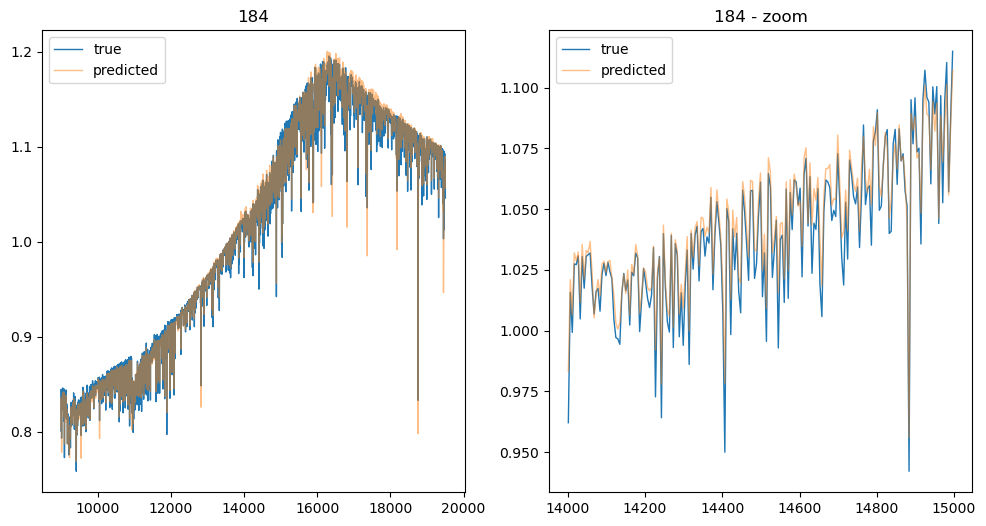

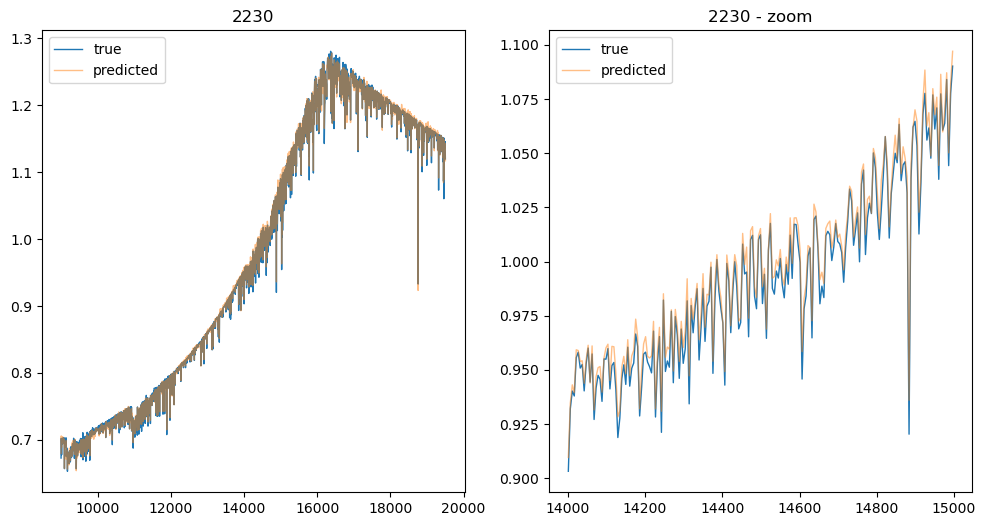

...

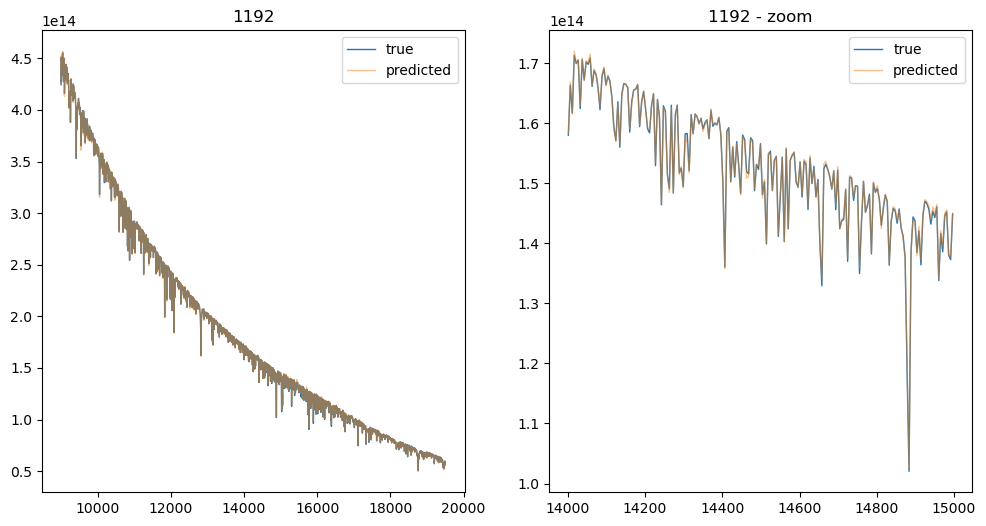

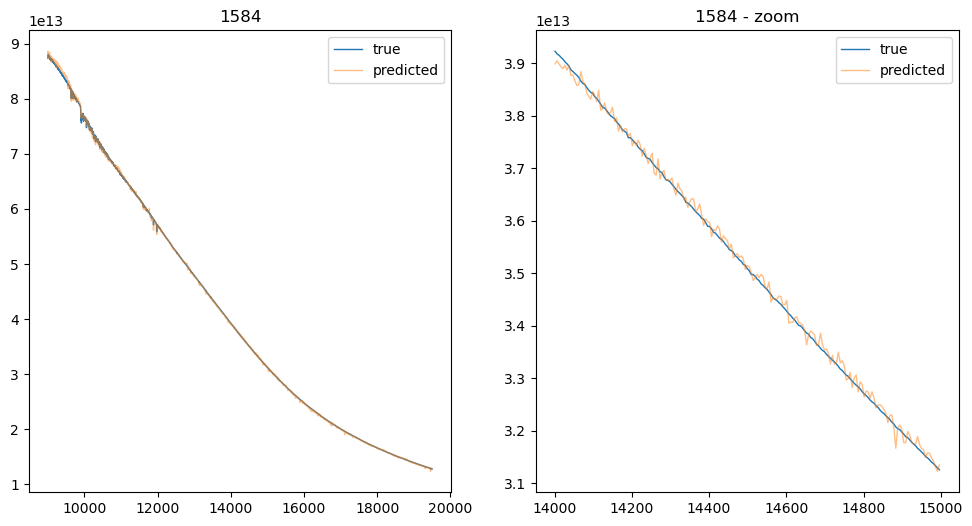

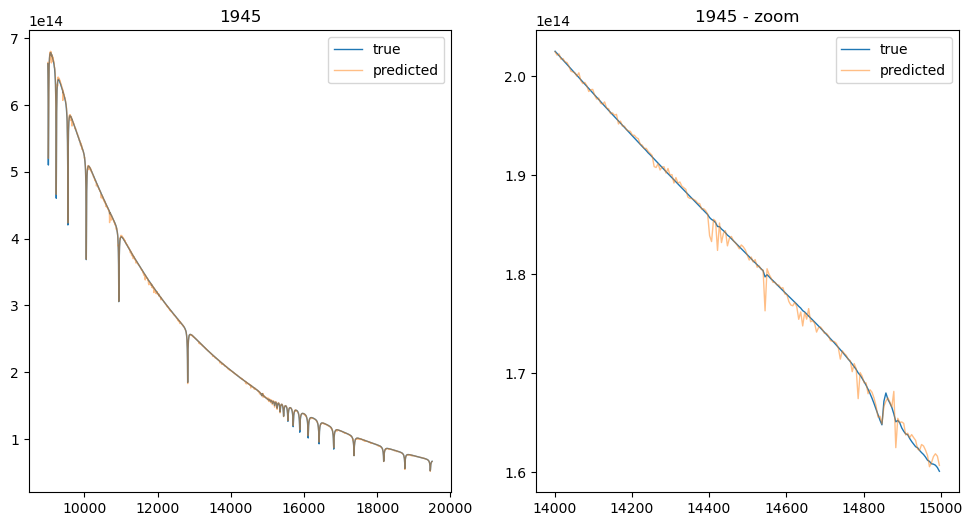

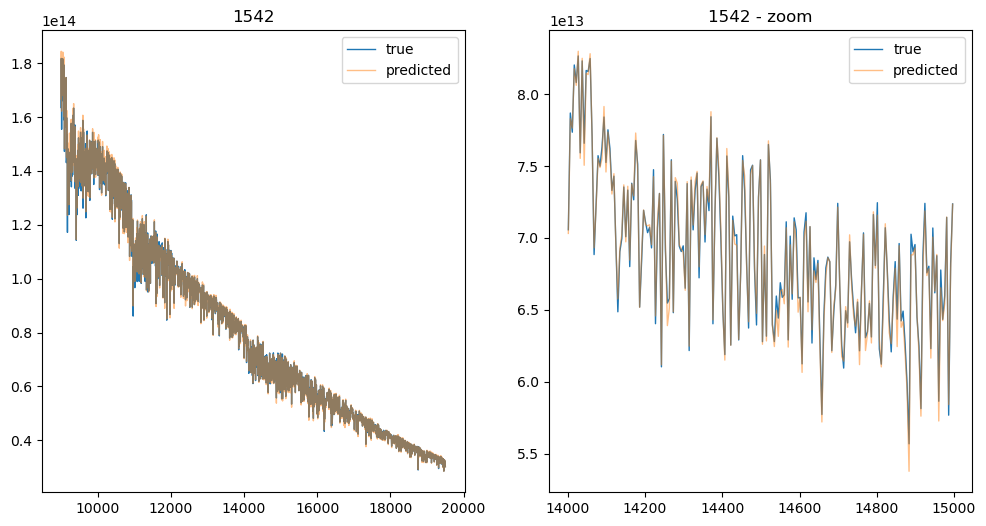

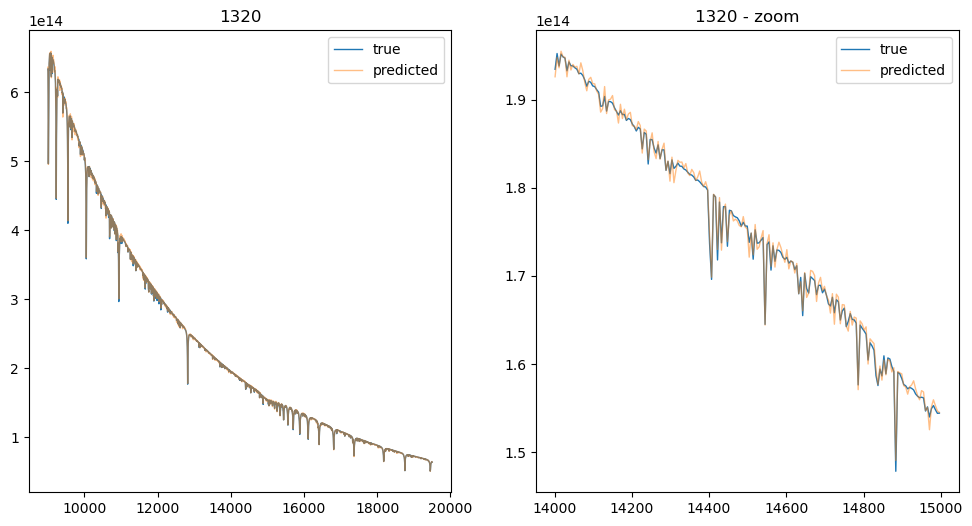

In [688]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(bbscaledfluxes.to(device, tensor_dtype), bbscaledfluxes.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    bb = models.BlackBody(temperature=infeatures[0].item()*u.K, scale=1*u.erg/u.s * u.cm**-3 / u.sr)
    bbflux = (bb(wl << u.angstrom)*(np.pi*u.sr)).to(u.erg/u.s * u.cm**-3).value
    return y.cpu()*bbflux
plot_sample_specs(model, data_split, descaler)

## Linear fit with scaled BB normalization

  0%|          | 0/12000 [00:00<?, ?it/s]

/tmp/ipykernel_8176/4146278476.py:29: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  return (y.cpu()*bbflux) * bbscaledstdm + bbscaledmean


(array([1100, 1194, 1485, 1001,  115]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

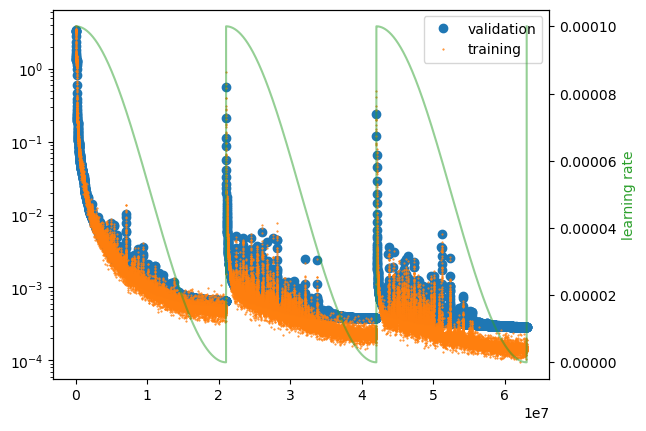

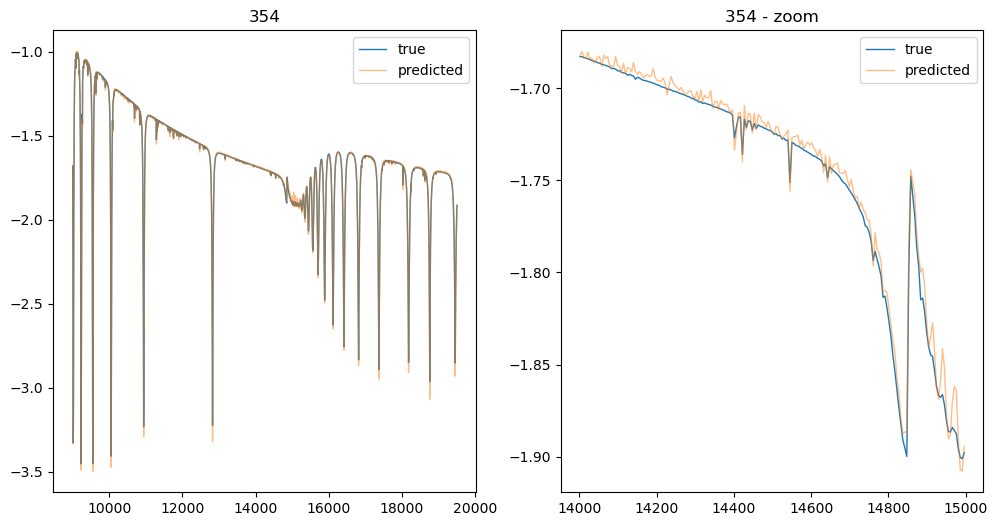

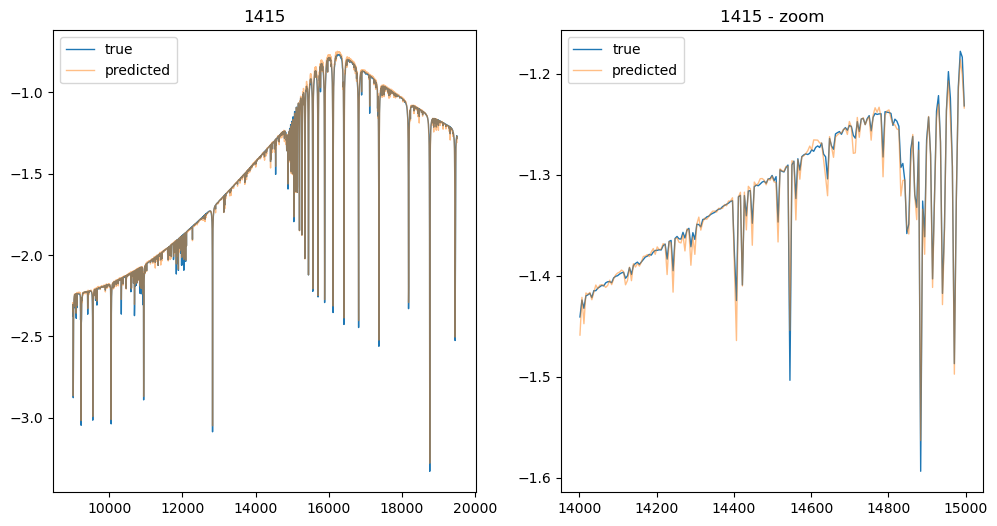

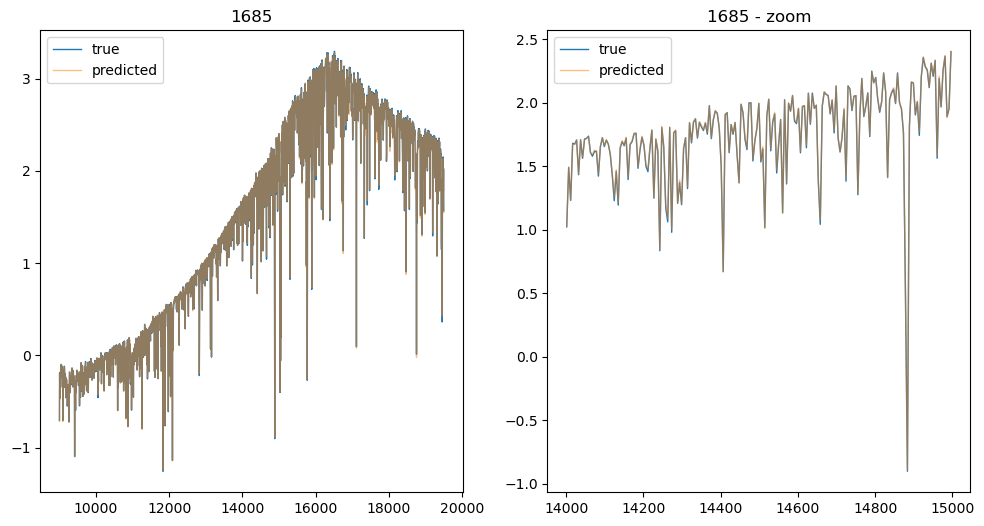

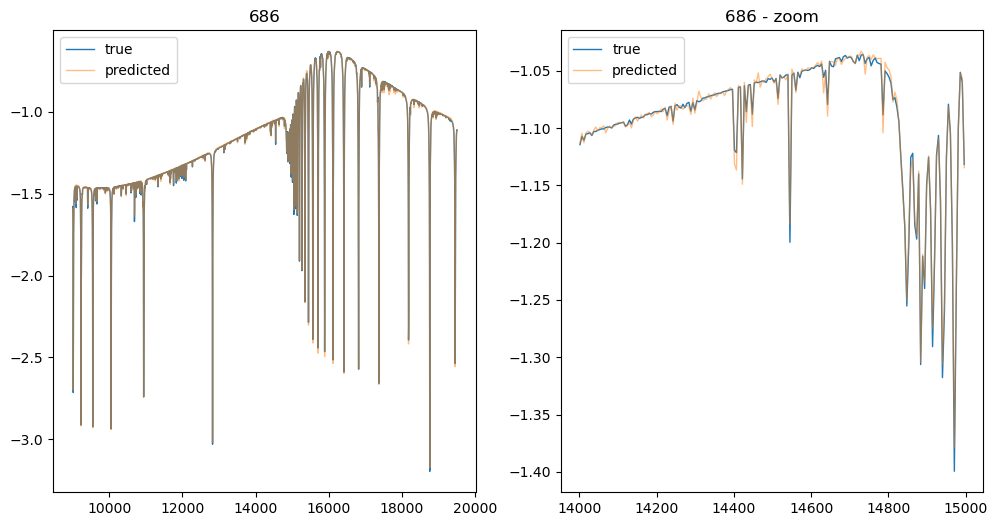

...

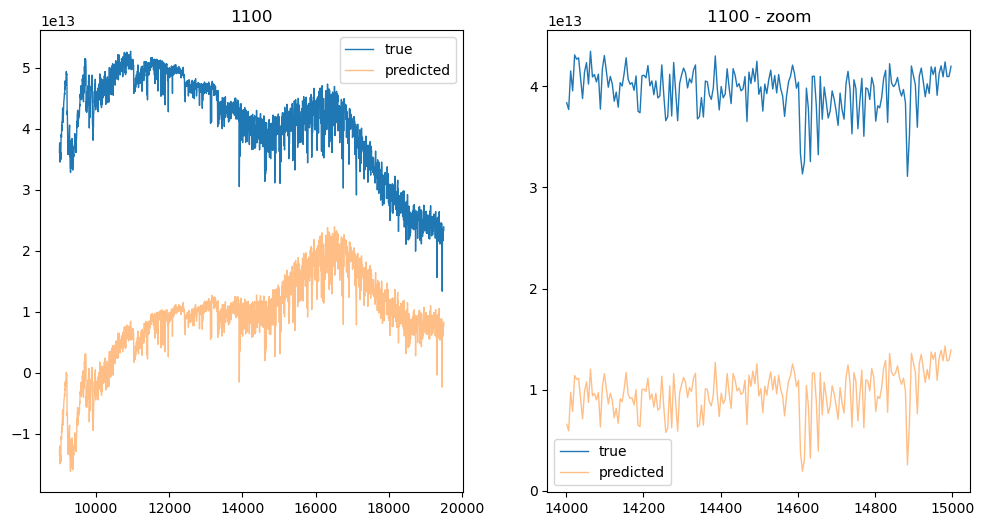

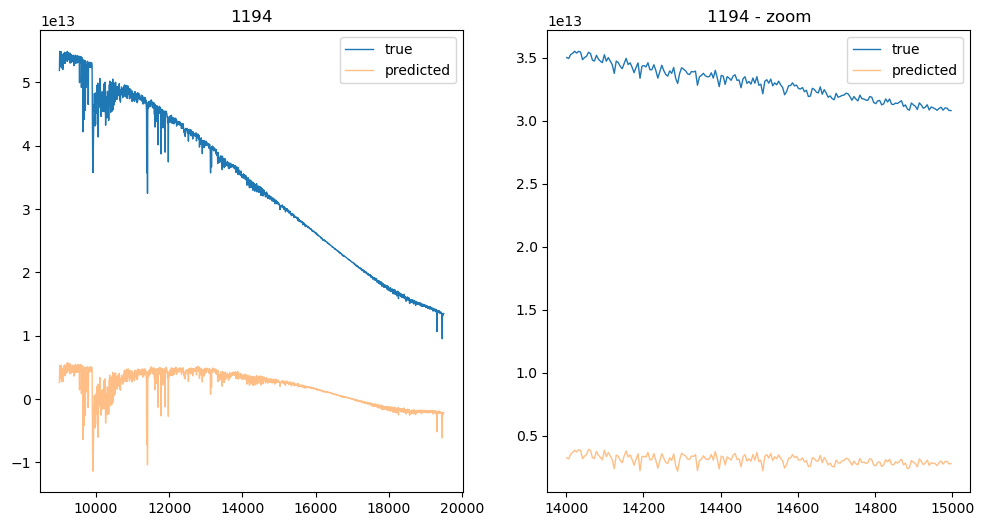

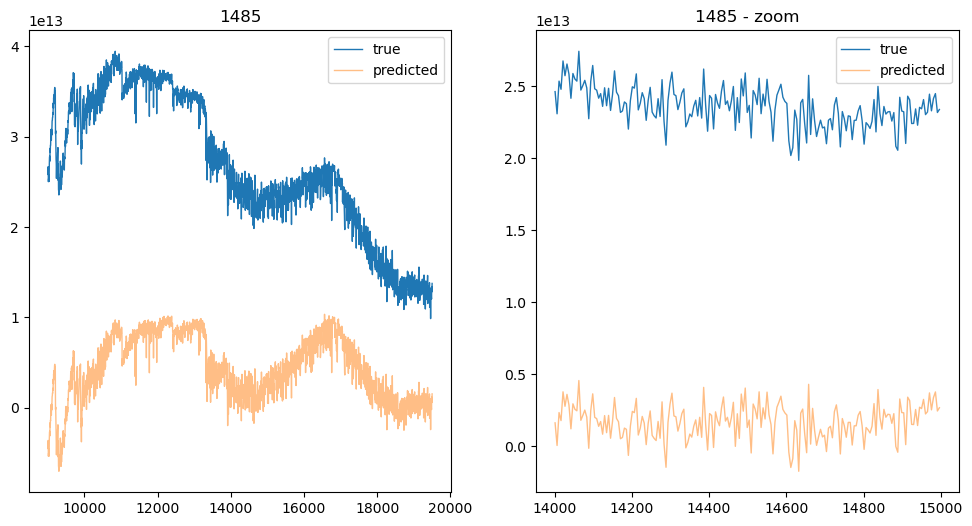

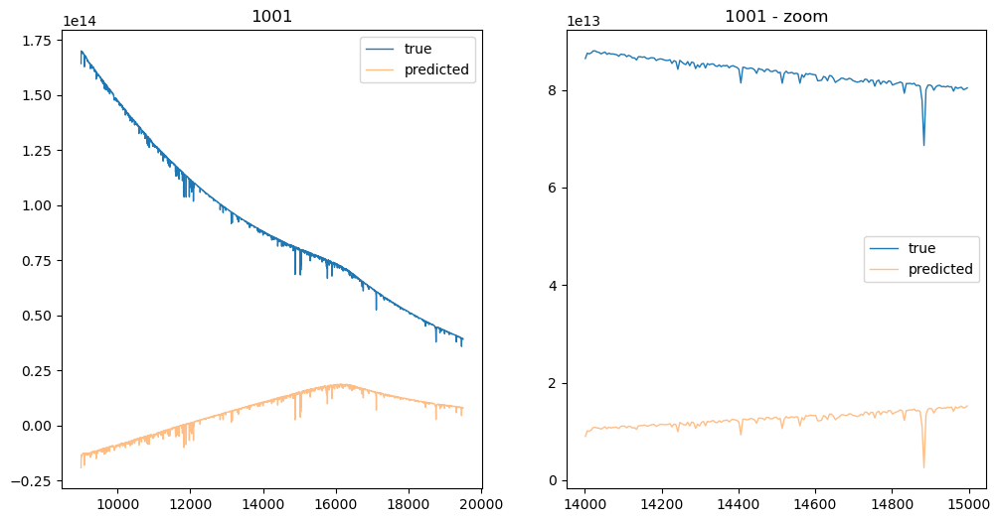

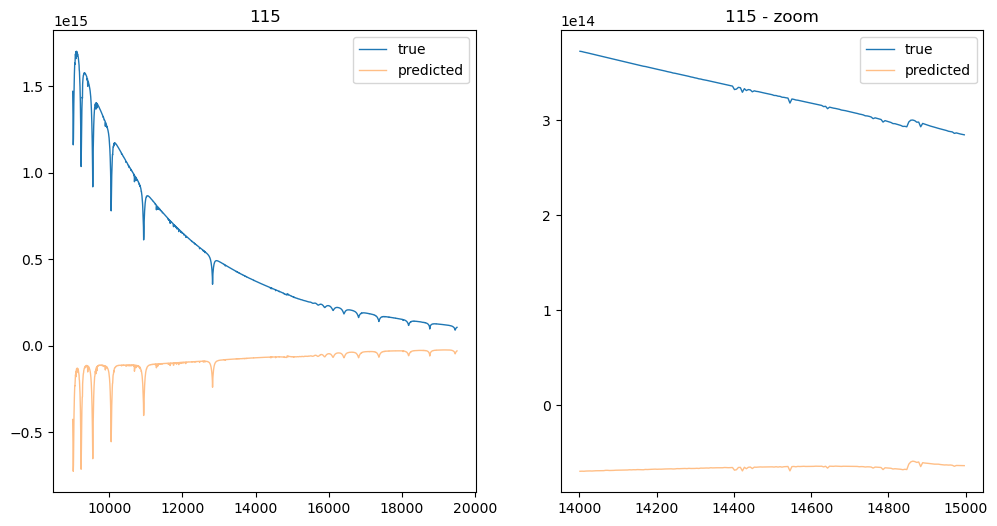

In [689]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(bbscaledfluxes2.to(device, tensor_dtype), bbscaledfluxes2.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    bb = models.BlackBody(temperature=infeatures[0].item()*u.K, scale=1*u.erg/u.s * u.cm**-3 / u.sr)
    bbflux = (bb(wl << u.angstrom)*(np.pi*u.sr)).to(u.erg/u.s * u.cm**-3).value
    return (y.cpu()*bbflux) * bbscaledstdm + bbscaledmean

plot_sample_specs(model, data_split, descaler)

## Simple BB normalization

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([1667, 1109, 1938,  399,  980]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

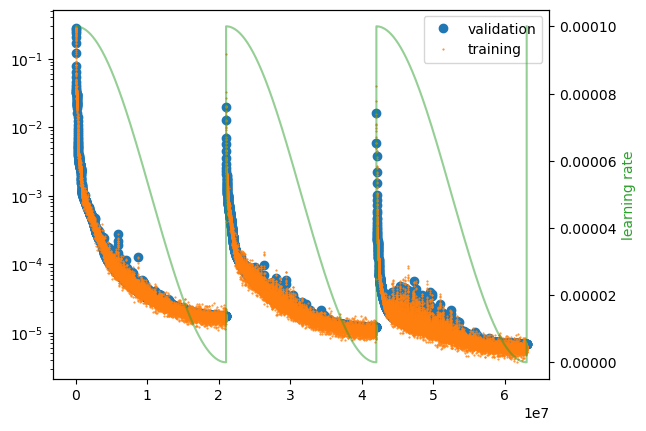

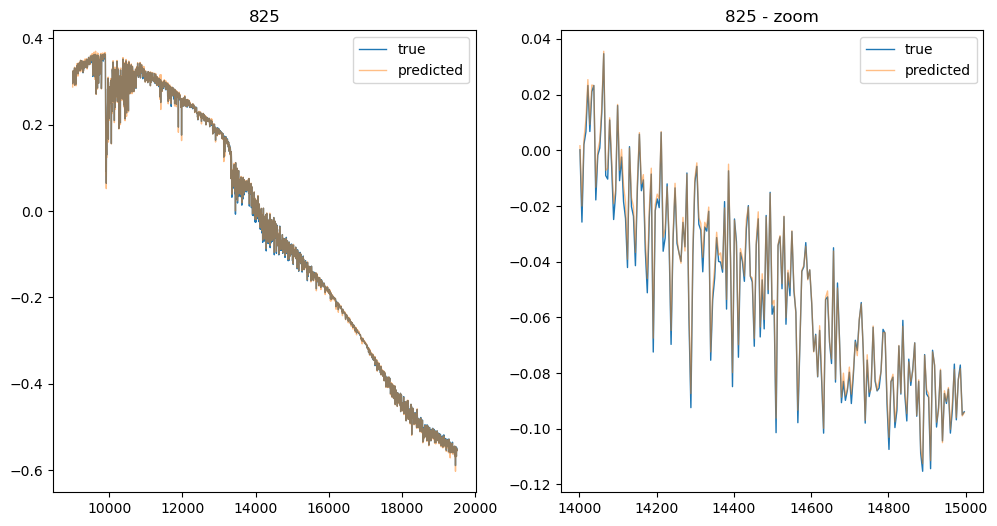

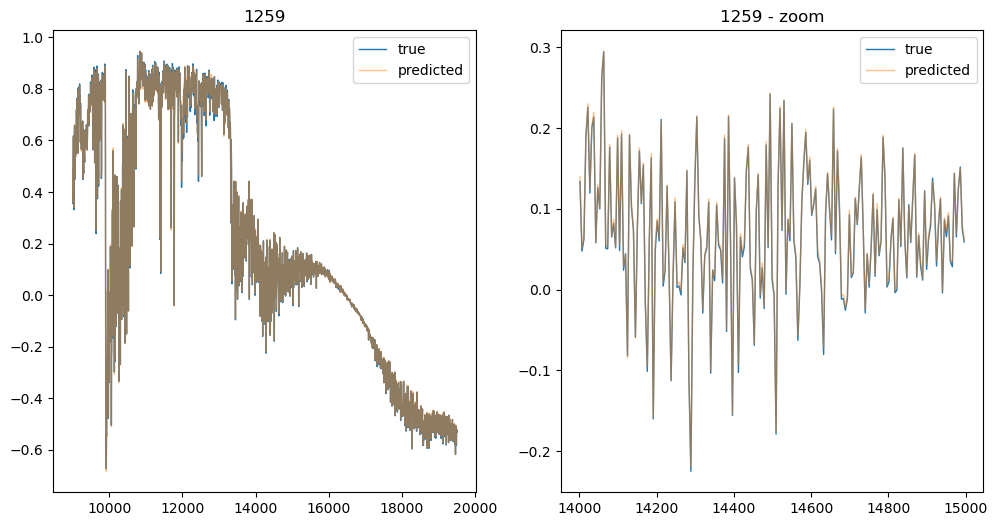

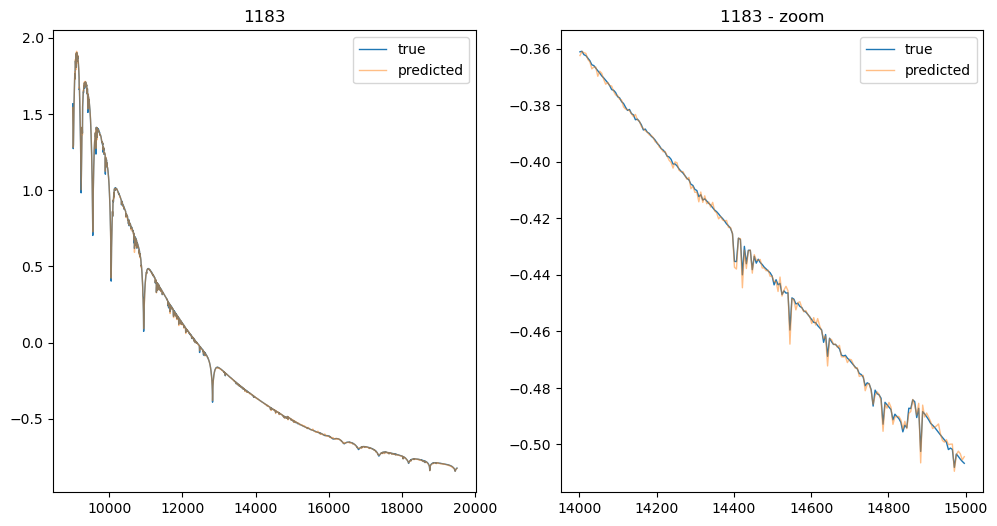

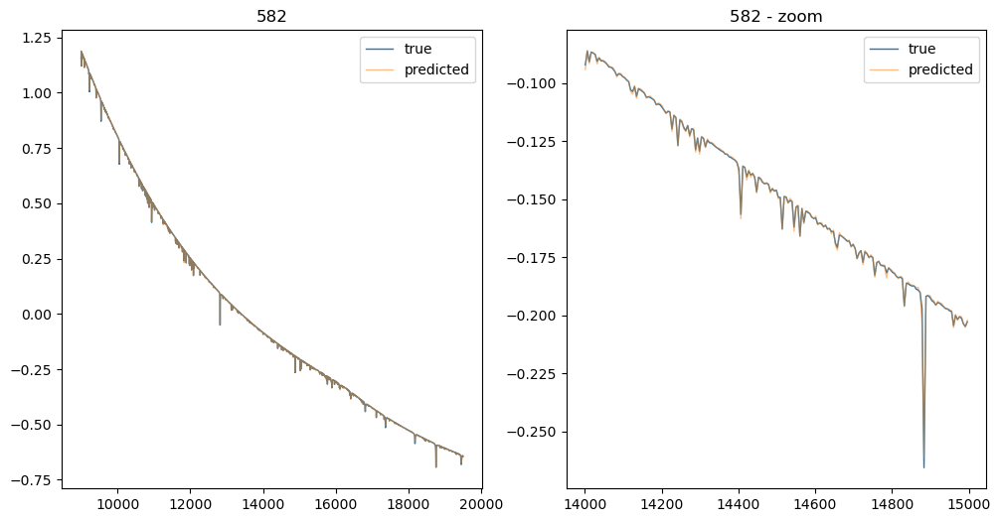

...

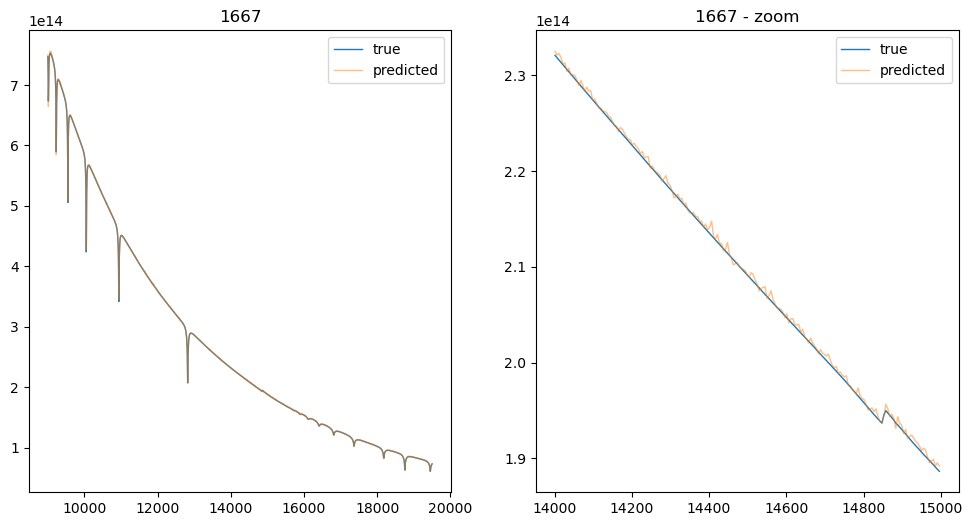

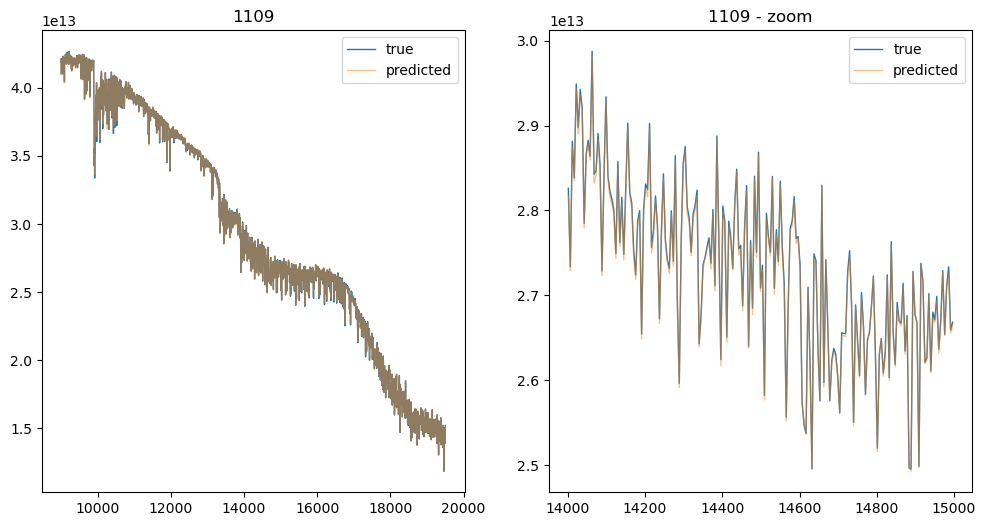

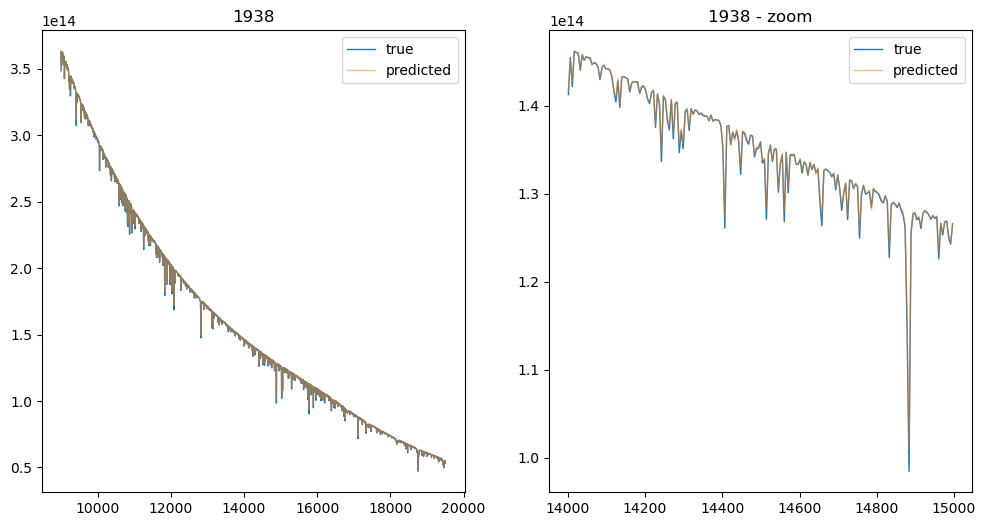

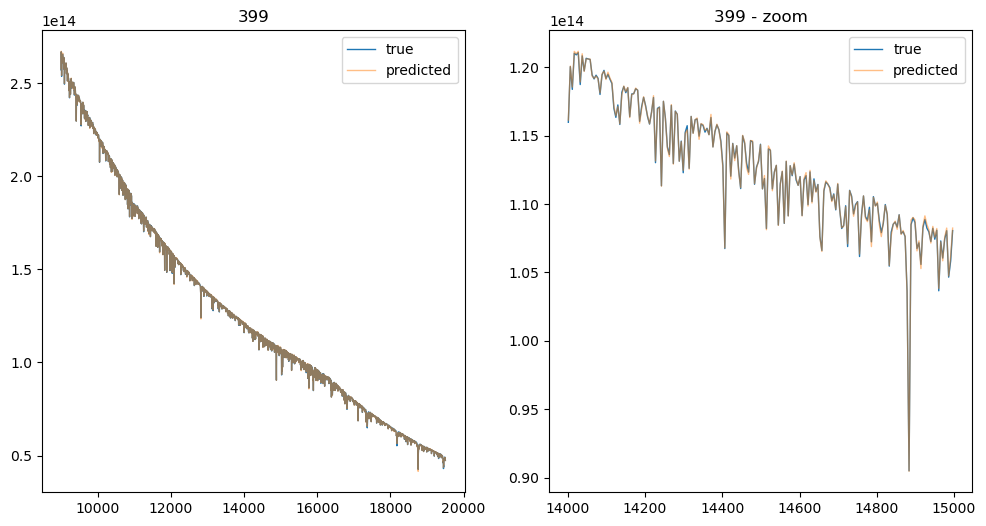

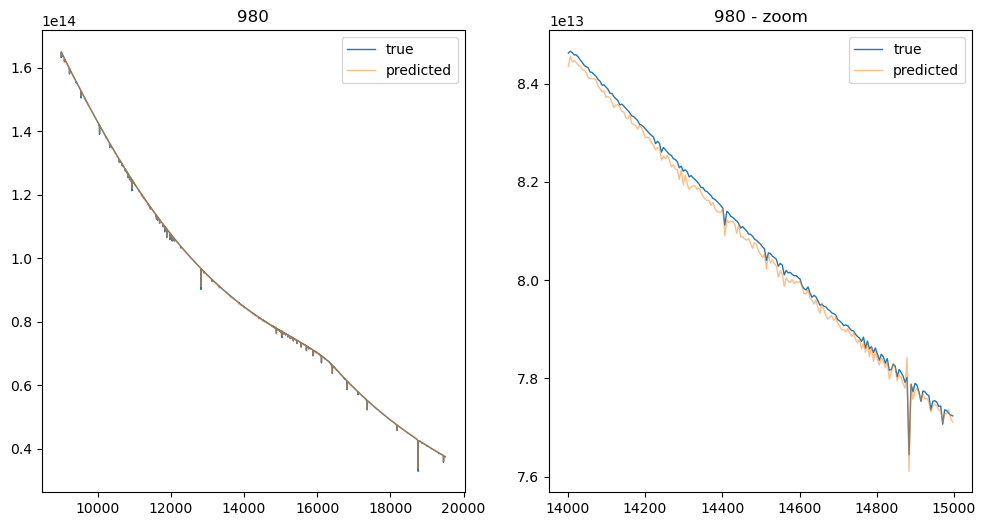

In [72]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

ds = TensorDataset(bbsimplescale.to(device, tensor_dtype), bbsimplescale.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    bb = models.BlackBody(temperature=infeatures[0].item()*u.K, scale=1*u.erg/u.s * u.cm**-3 / u.sr)
    bbflux = (bb(wl << u.angstrom)*(np.pi*u.sr)).to(u.erg/u.s * u.cm**-3).value
    return (y + 1)*bbflux.mean() 
    
plot_sample_specs(model, data_split, descaler)

## Logarithmic

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([1612, 1420, 1046, 1598, 1019]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

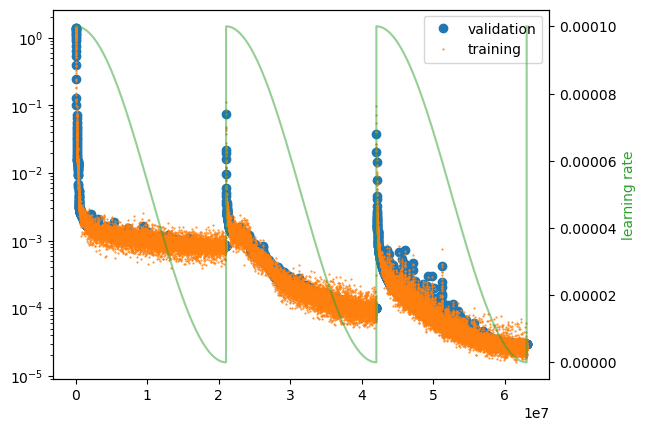

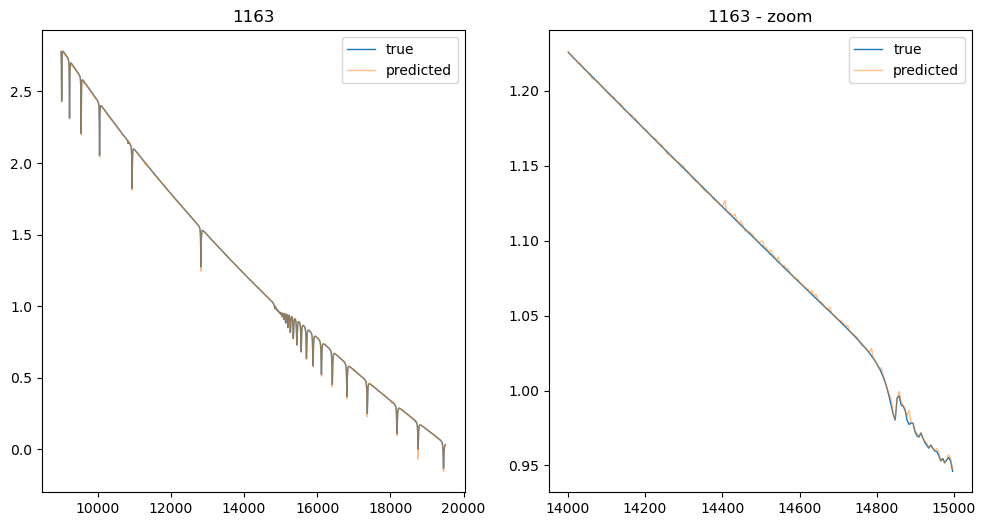

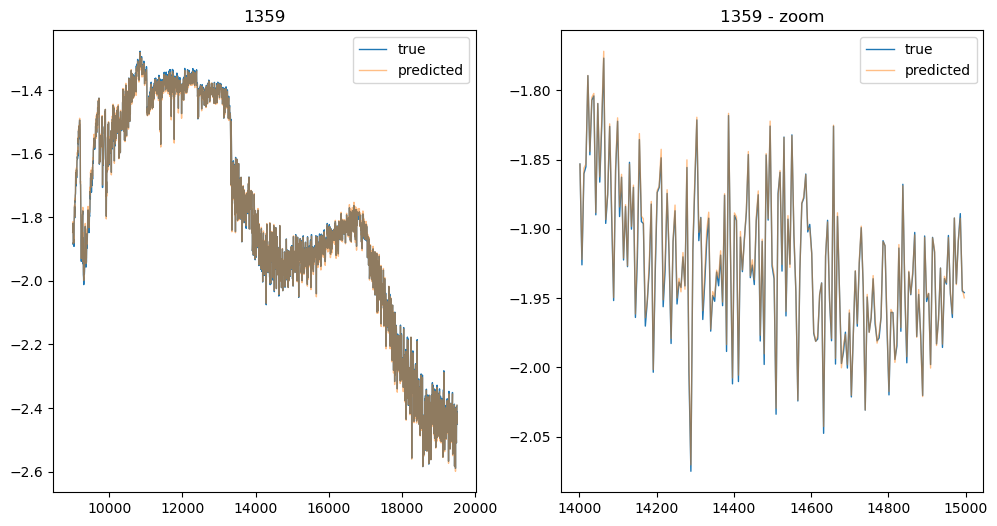

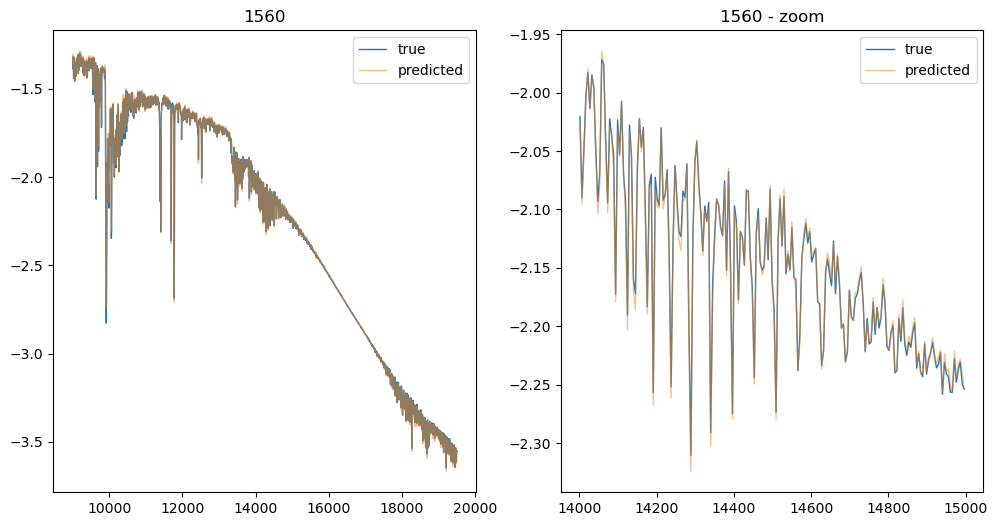

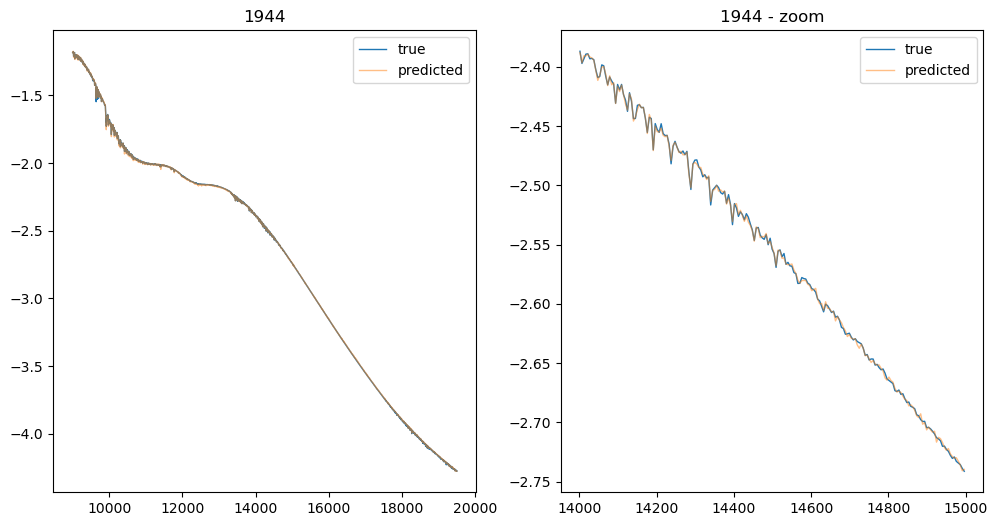

...

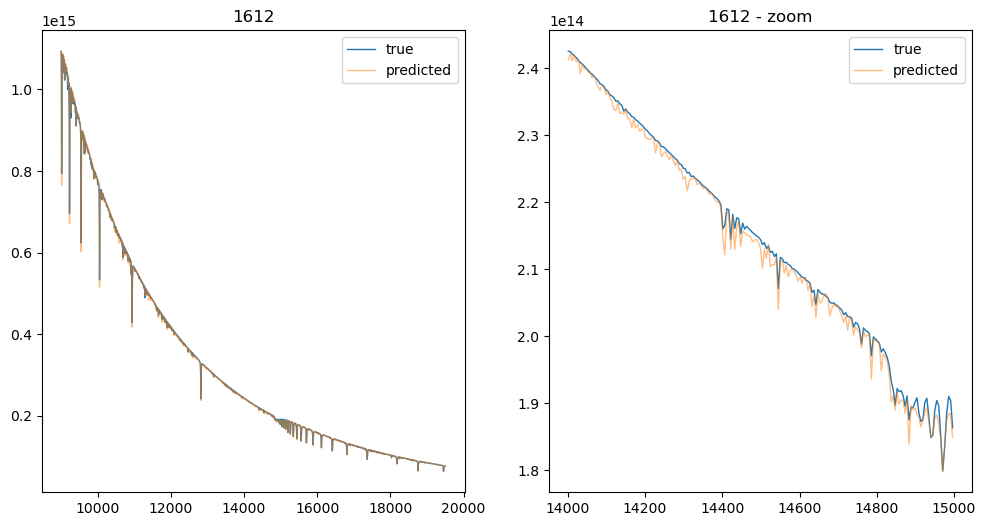

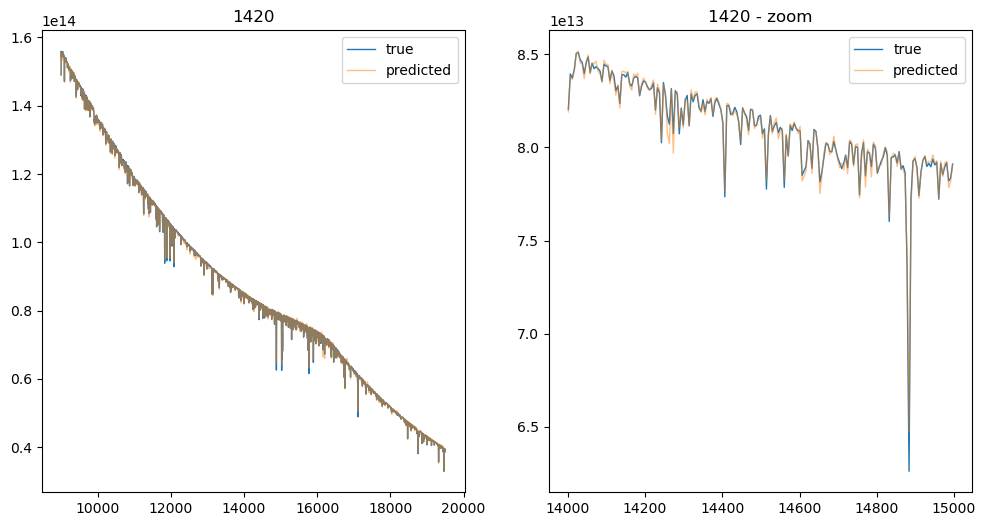

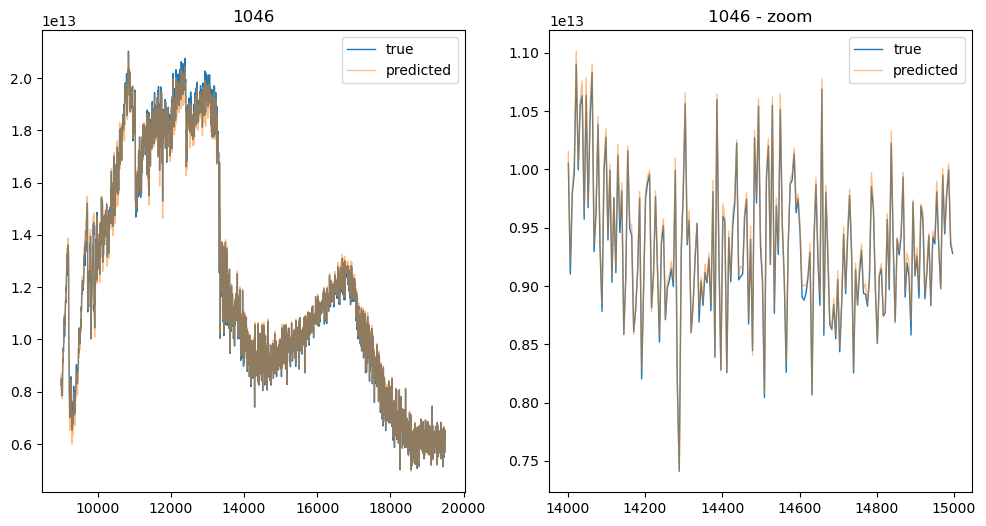

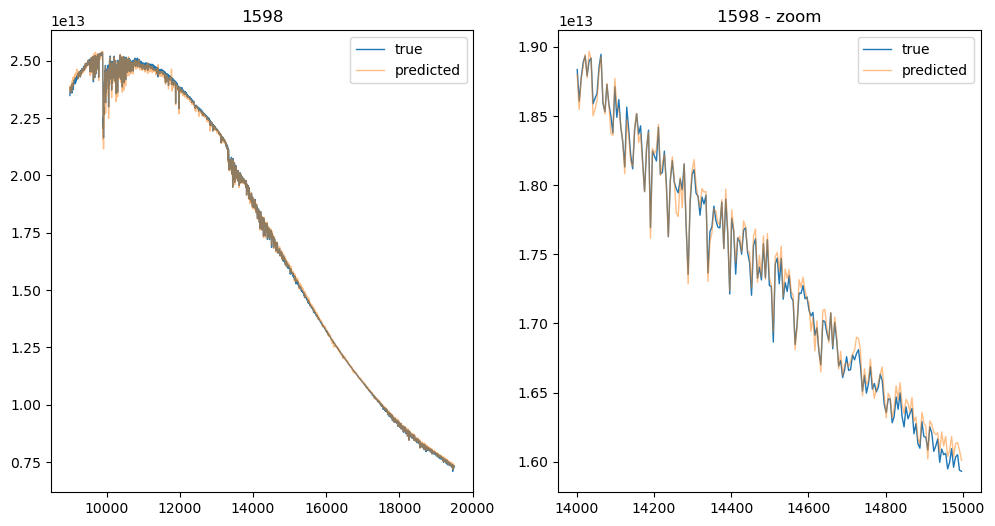

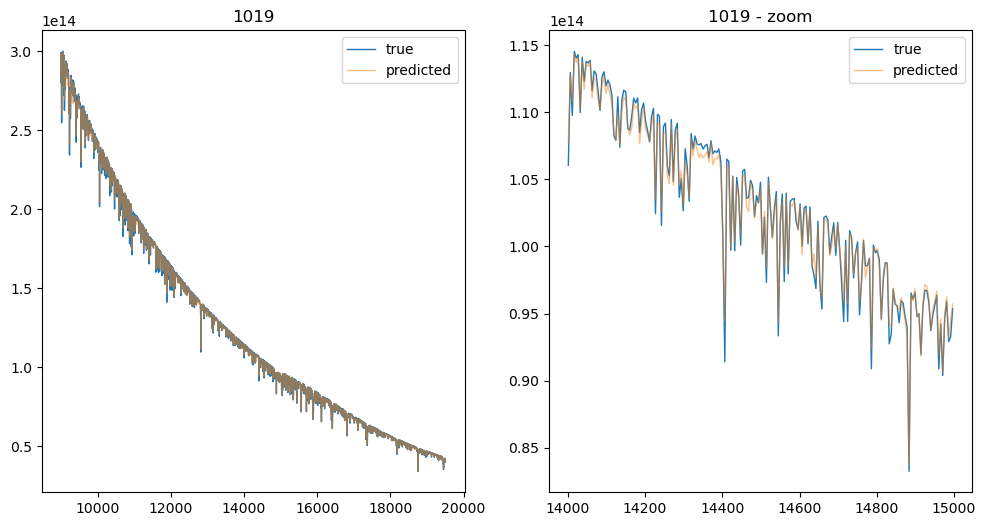

In [75]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

meanlog = torch.log(fluxes).mean()
ds = TensorDataset((torch.log(fluxes) - meanlog).to(device, tensor_dtype), (torch.log(fluxes) - meanlog).to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    return torch.exp(y + meanlog)

plot_sample_specs(model, data_split, descaler)

  0%|          | 0/12000 [00:00<?, ?it/s]

(array([ 489, 1645, 1277,  679,  279]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

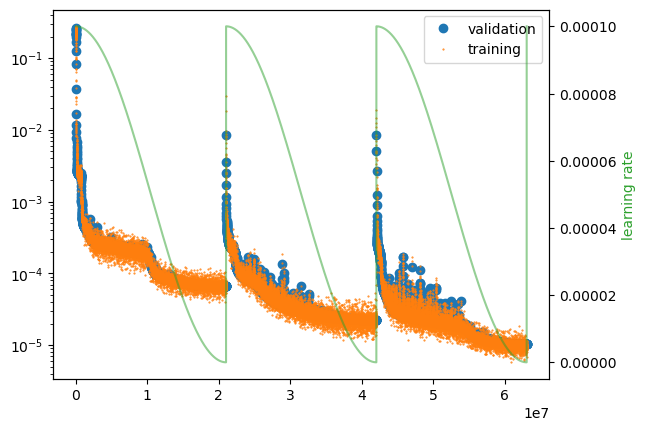

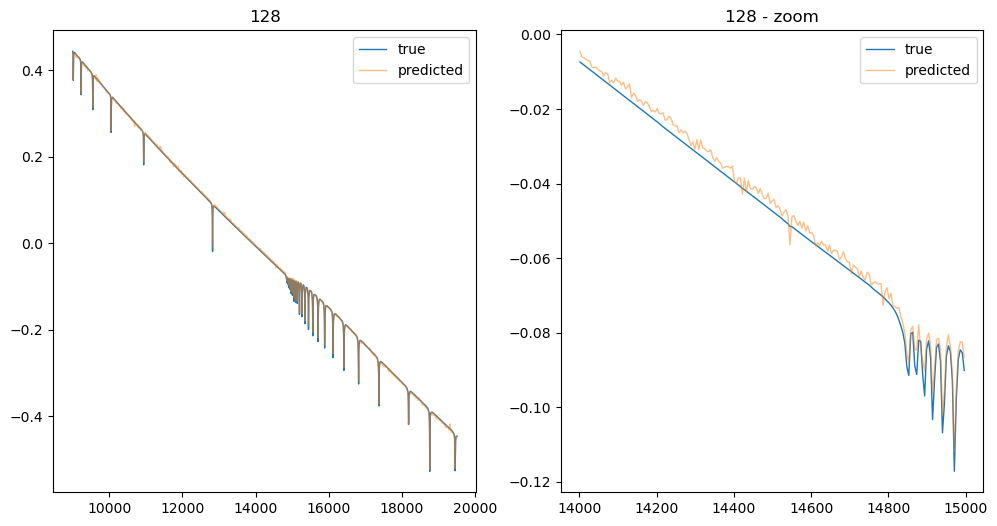

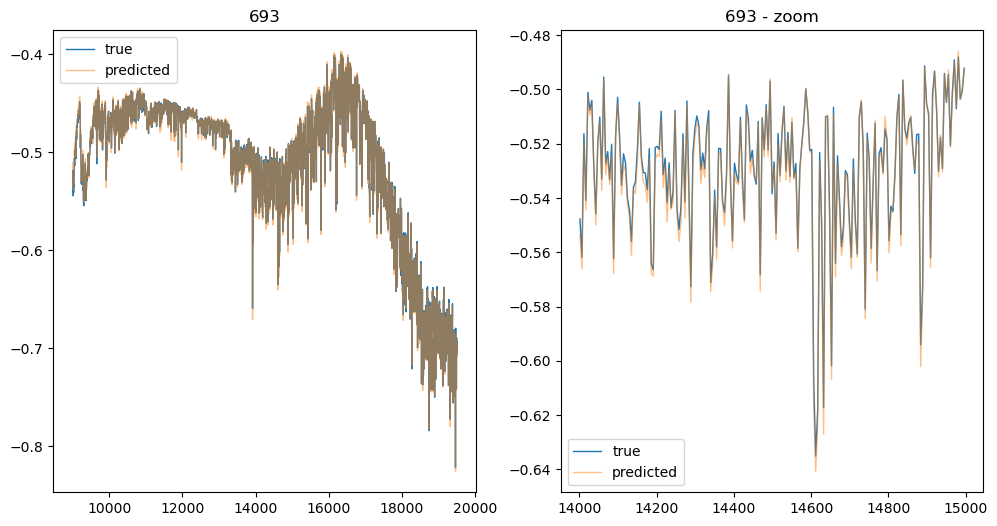

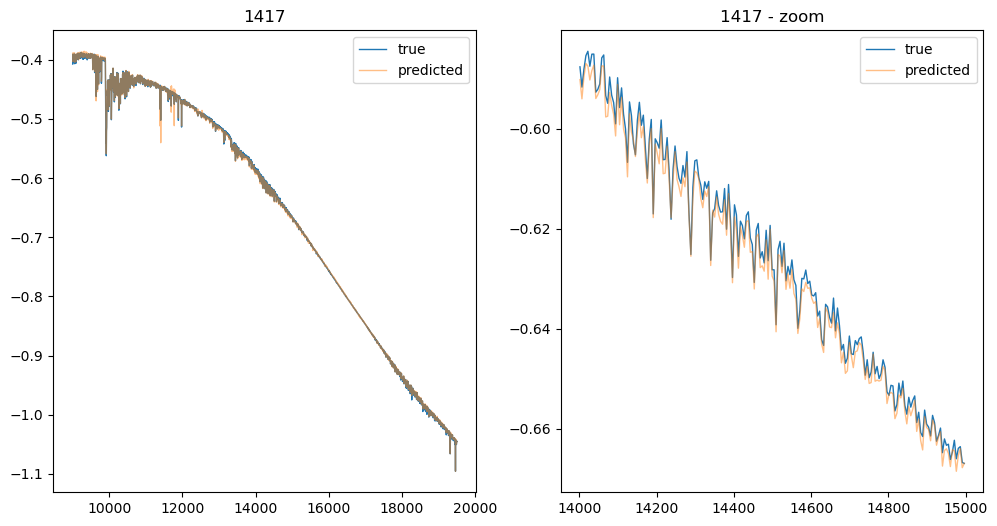

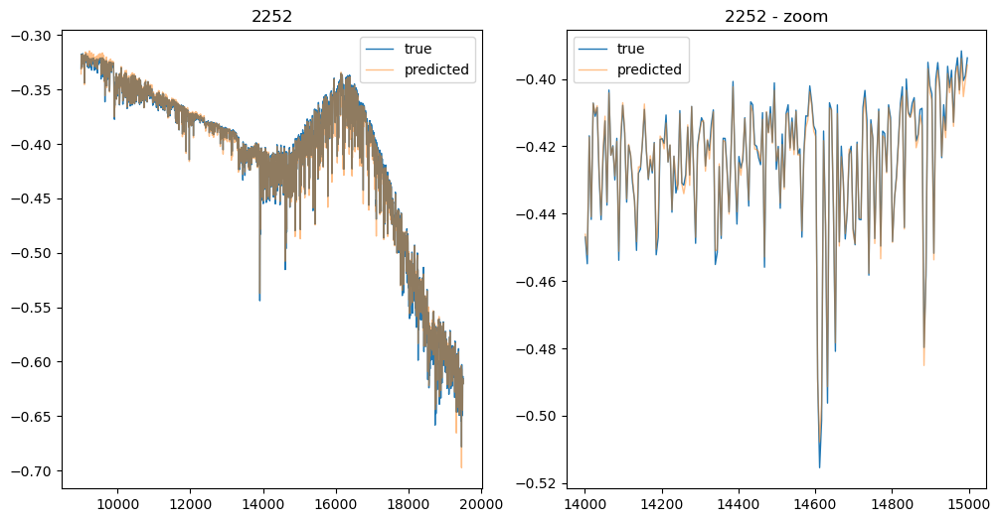

...

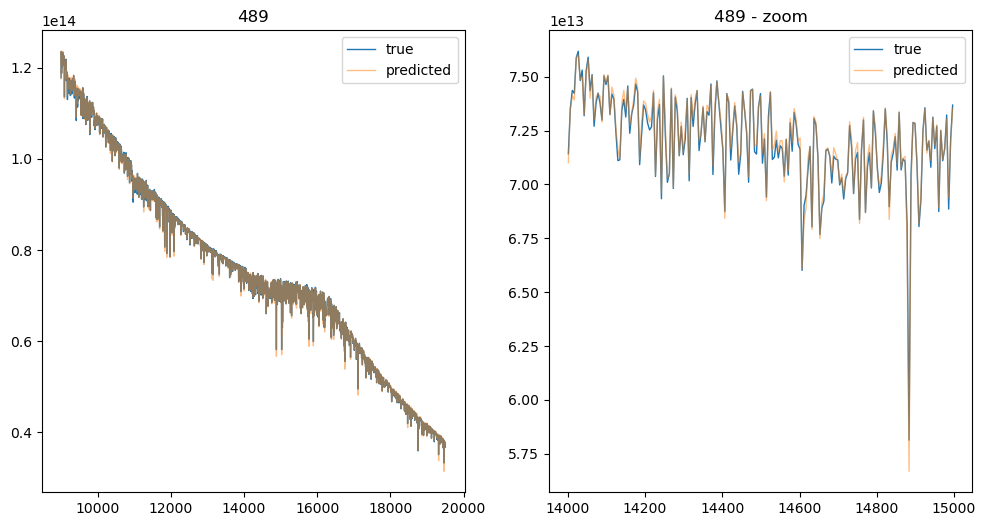

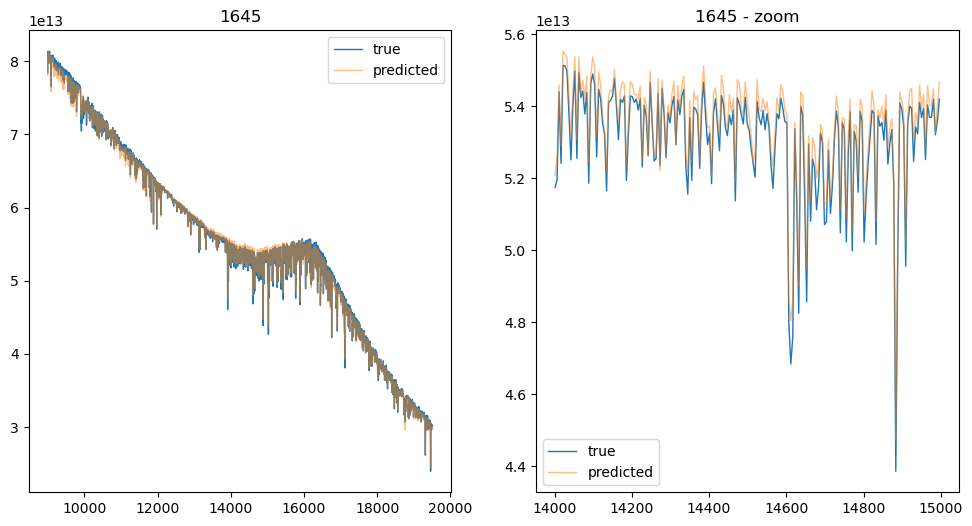

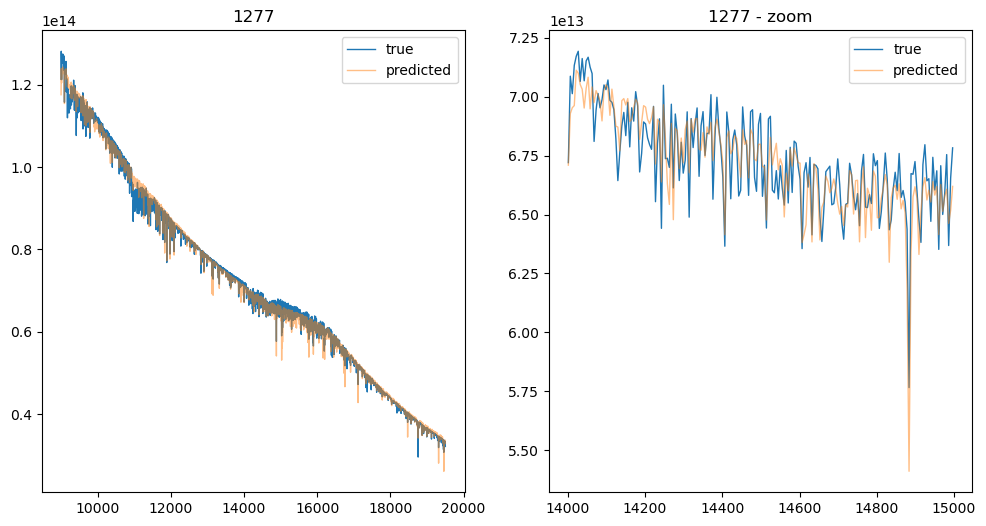

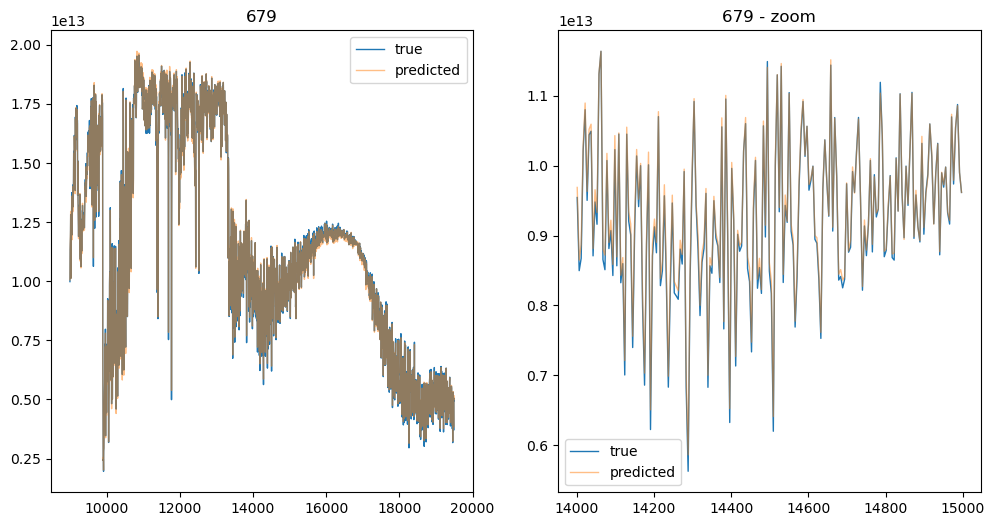

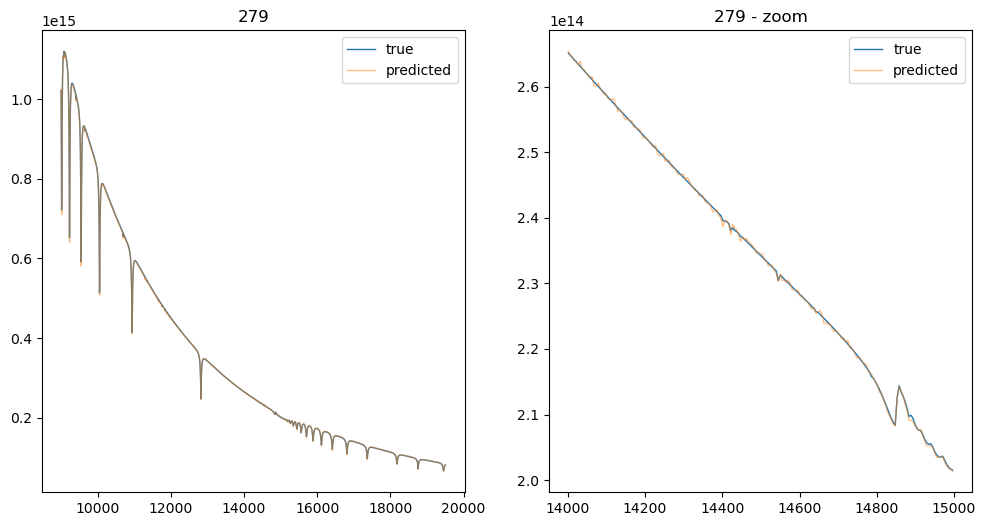

In [74]:
model = Autoencoder(fluxes.shape[-1], nneurons_test).to(device, tensor_dtype)

meanlog = torch.log10(fluxes).mean()
ds = TensorDataset((torch.log10(fluxes) - meanlog).to(device, tensor_dtype), (torch.log10(fluxes) - meanlog).to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    return 10**(y+meanlog)

plot_sample_specs(model, data_split, descaler)

# Polynomial-style fit tests

In [36]:
class PolynomialNN(nn.Module):
    def __init__(self, inranges, npix, degree, inlog=None):
        """
        inranges sets nfeatures, [(f1min, f1max), (f2min, f2max), ...]
        """
        super().__init__()

        
        self.inscale = torch.Tensor([mx-mi for mi,mx in inranges])
        self.inmin = torch.Tensor([mi for mi,mx in inranges])
        self.inlog = inlog

        self.polyarr = torch.arange(degree + 1)

        self.npix = npix
        self.nfeat = len(inranges)

        self.coeffs = nn.Linear(len(self.polyarr)*self.nfeat, self.npix, bias=False)

    def input_transform(self, x):
        """
        assumes m,npix, nfeatures input shape
        """
        x = (x - self.inmin) / self.inscale
    
        if self.inlog is not None:
            for i, logf in enumerate(self.inlog):
                x[...,i] = torch.log10(x[...,i])
    
        return x

    def forward(self, x):
        # input is m x nfeat, output should be m x npix
        
        X = self.input_transform(x) # m x nfeat
        px = torch.pow(X[..., None], self.polyarr) # m x nfeat x degree
        pxf = px.reshape(px.shape[0], px.shape.numel()//px.shape[0]) # m x nfeat*degree
        return self.coeffs(pxf) # m x npix
    
    
# testpnn = PolynomialNN([(0,8),(0,8)], 5, 1)
# with torch.no_grad():
#     testpnn.coeffs.weight[0:] = 1
    
# testpnn(torch.arange(8).reshape(4,2))

In [39]:
nperrestart = 250
nrestarts = 2
lr = 3e-1
wd = 1e-4

  0%|          | 0/2000 [00:00<?, ?it/s]

(array([ 958,   39,  155, 2037, 1688]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

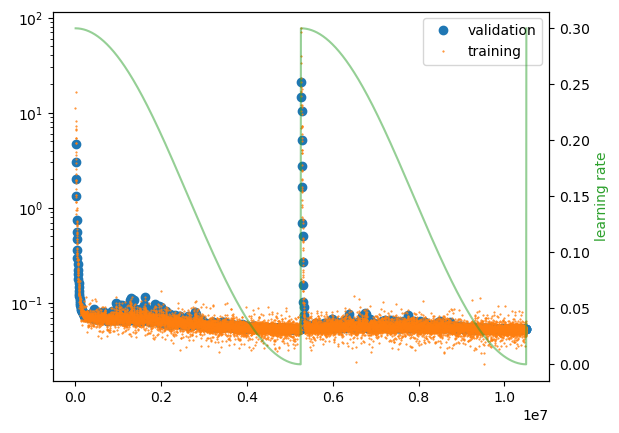

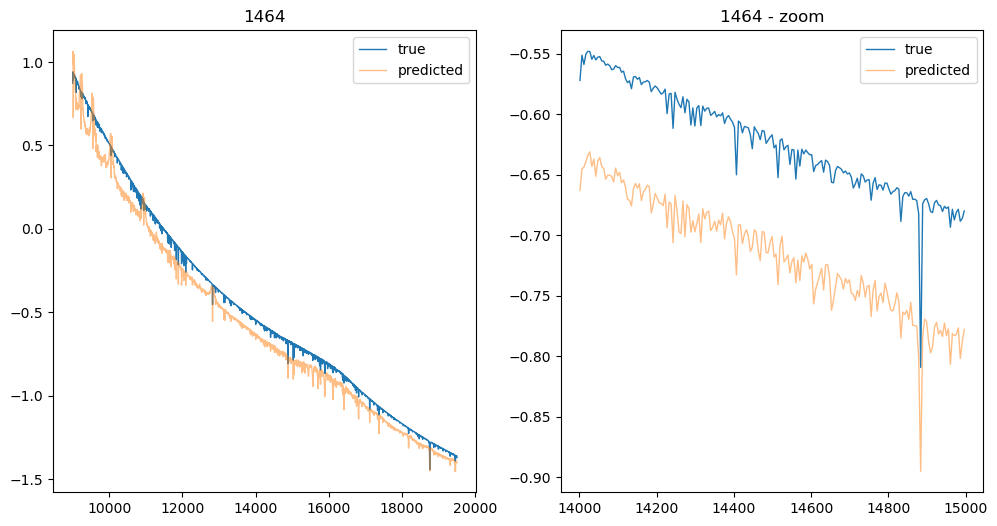

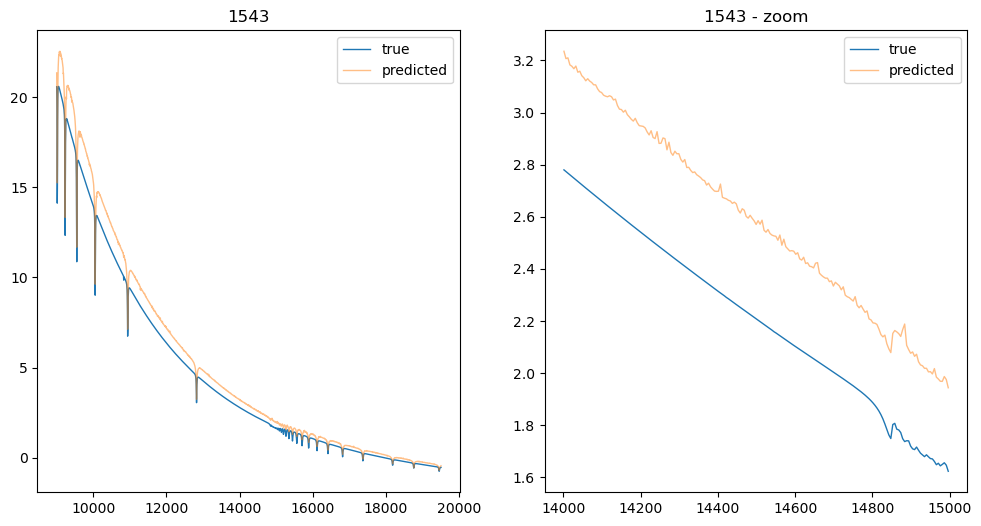

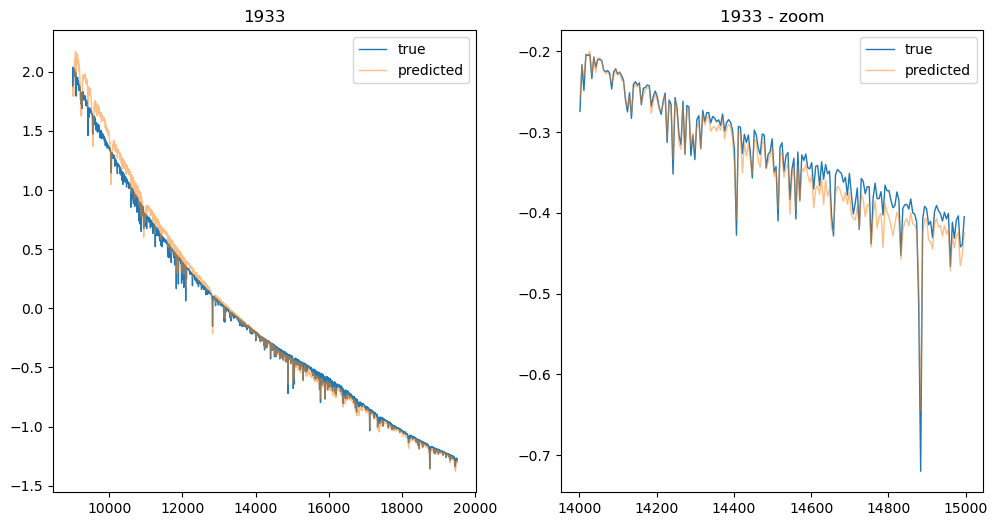

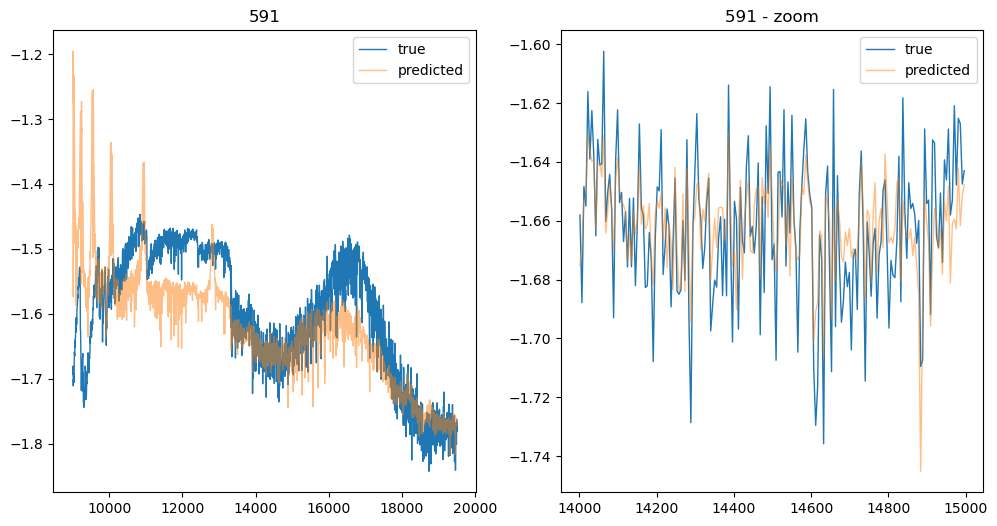

...

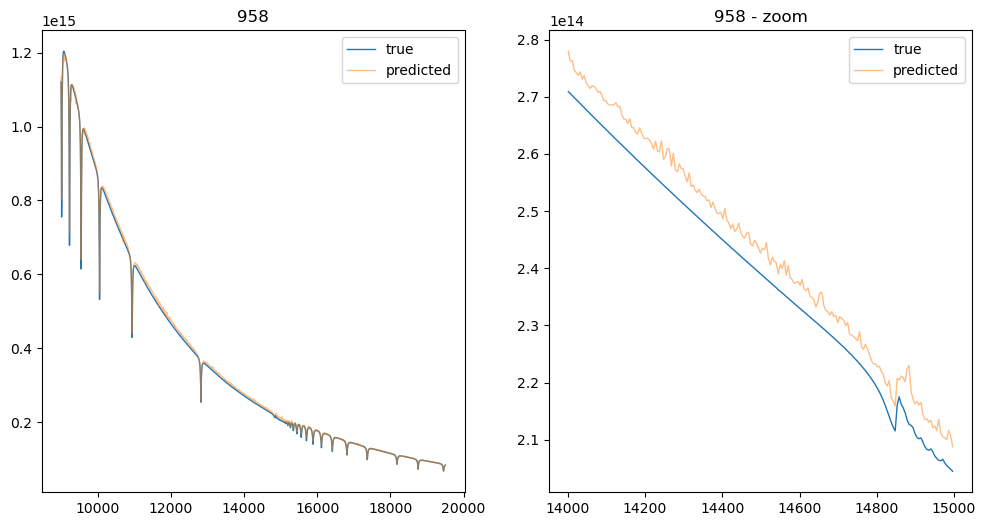

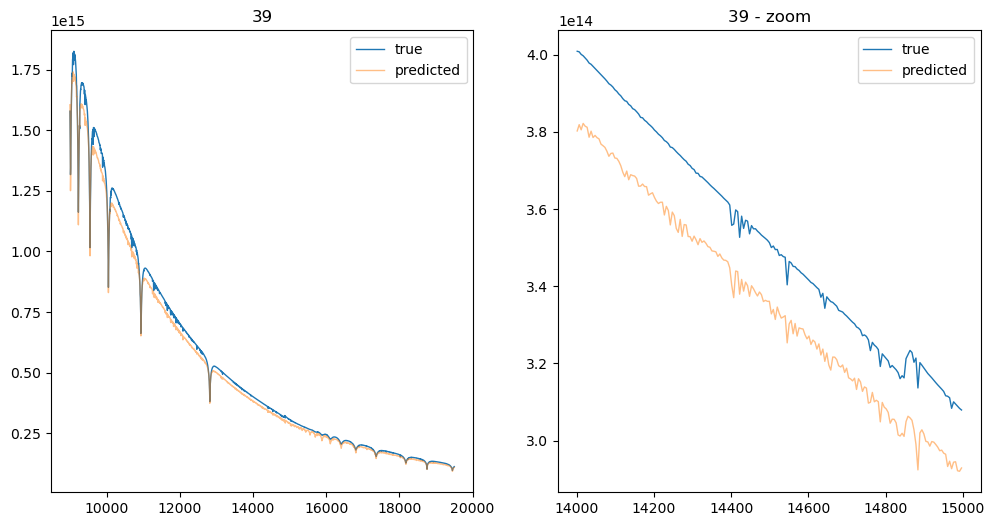

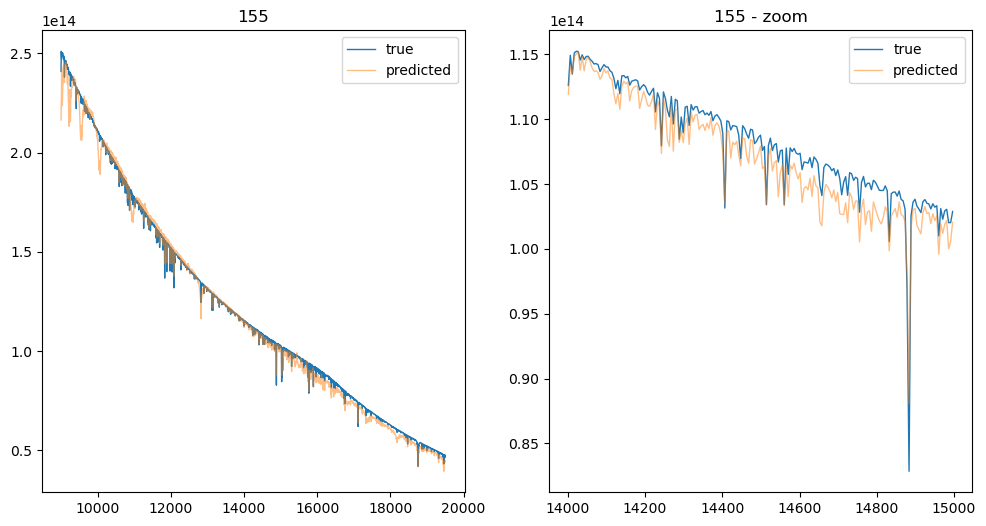

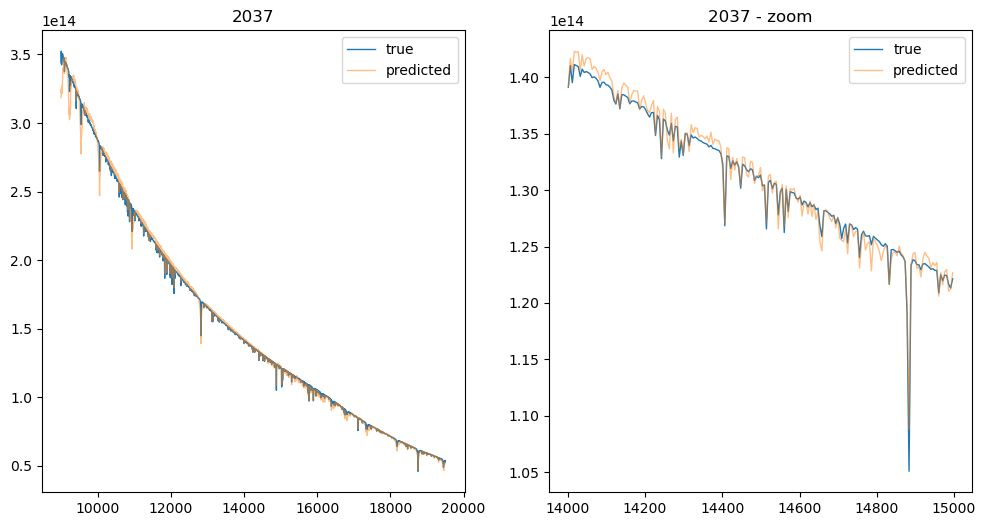

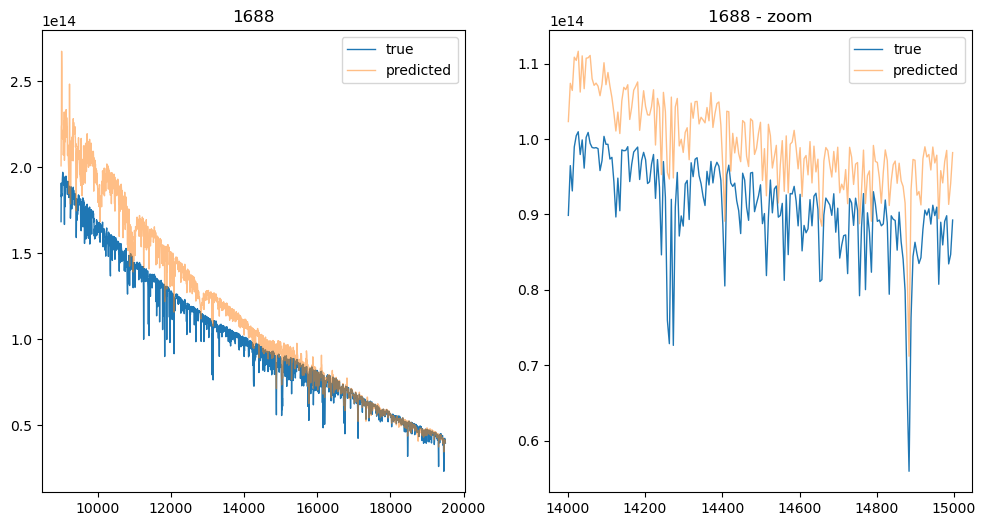

In [33]:
inranges = [(f.min(), f.max()) for f in infeatures.T.to(device, tensor_dtype)]
model = PolynomialNN(inranges, fluxes.shape[-1], 20).to(device, tensor_dtype)
model.inscale = model.inscale.to(device, tensor_dtype)
model.inmin = model.inmin.to(device, tensor_dtype)
model.polyarr = model.polyarr.to(device, tensor_dtype)

ds = TensorDataset(infeatures.to(device, tensor_dtype), globalmeds.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)

def descaler(y, infeatures, m=torch.median(fmeans), s=torch.median(fstds)):
    return y*s + m
plot_sample_specs(model, data_split, descaler)

  0%|          | 0/500 [00:00<?, ?it/s]

(array([1738, 1121,   29,   66, 1046]),
 [<Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>,
  <Figure size 1200x600 with 2 Axes>])

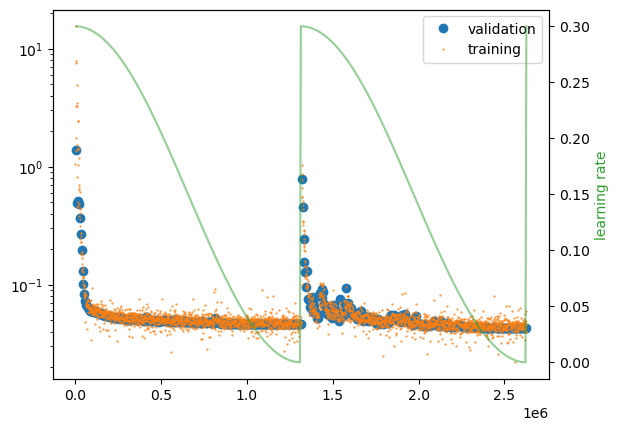

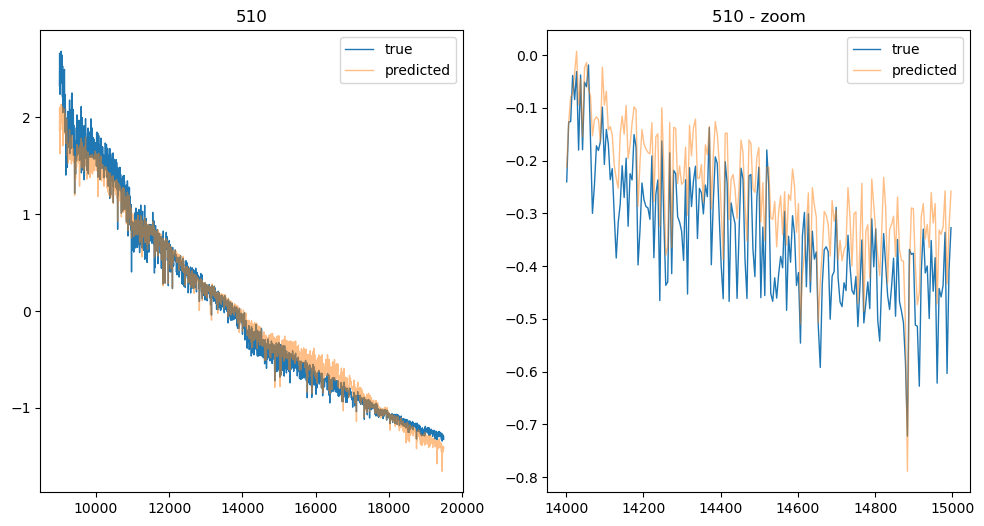

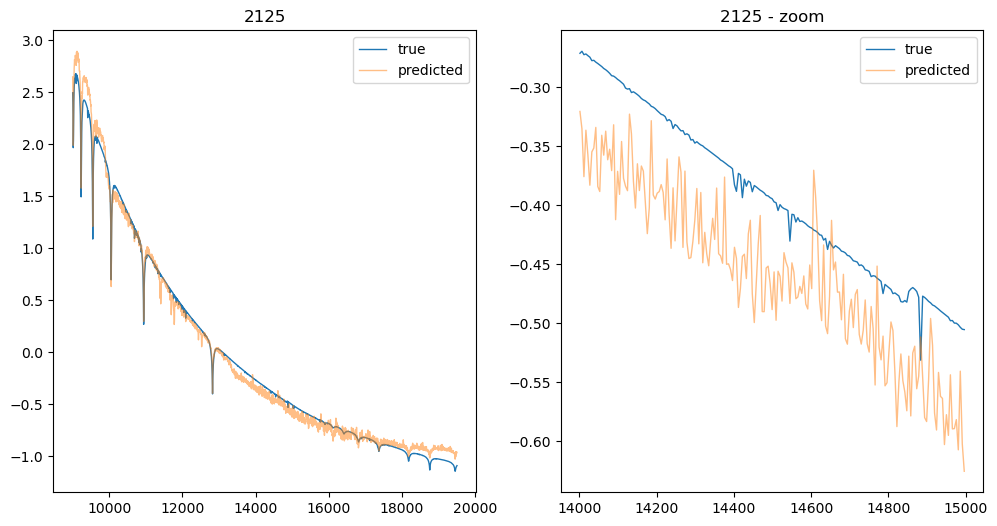

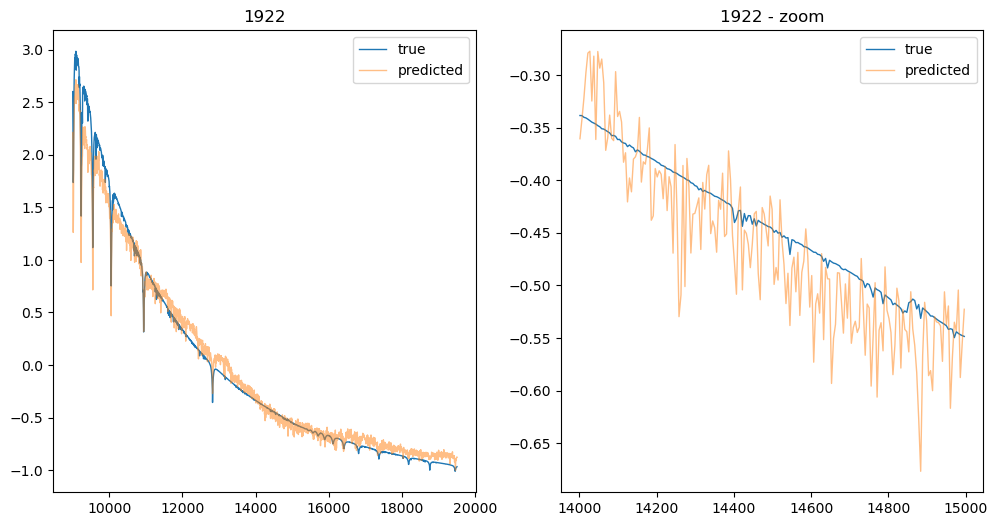

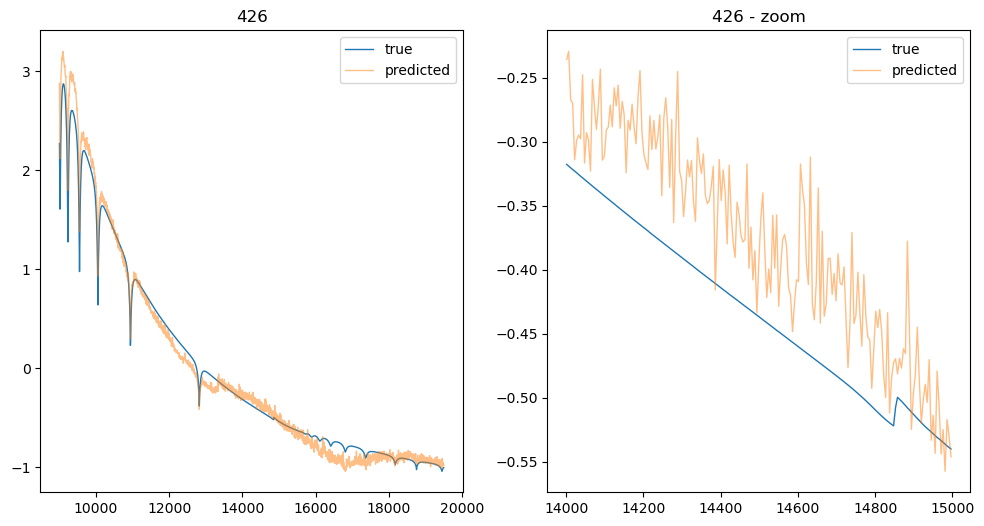

...

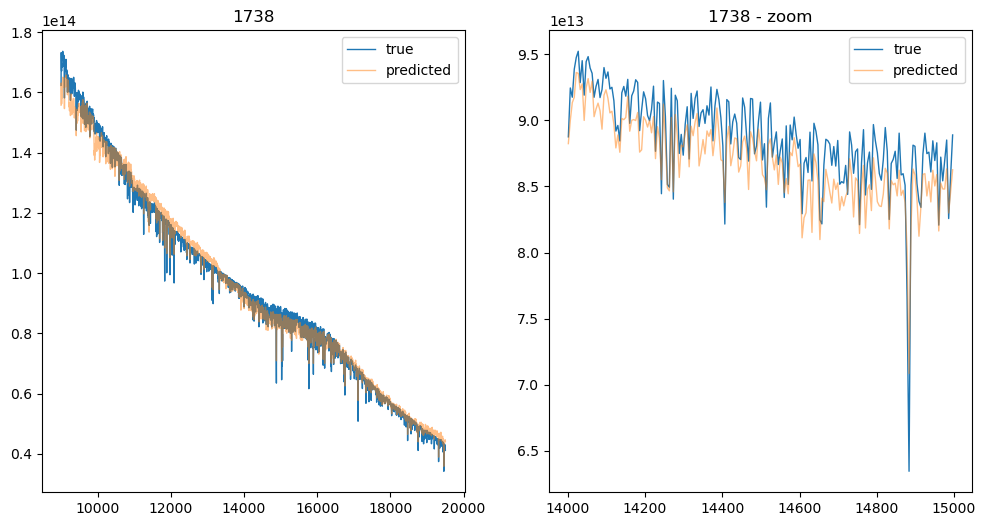

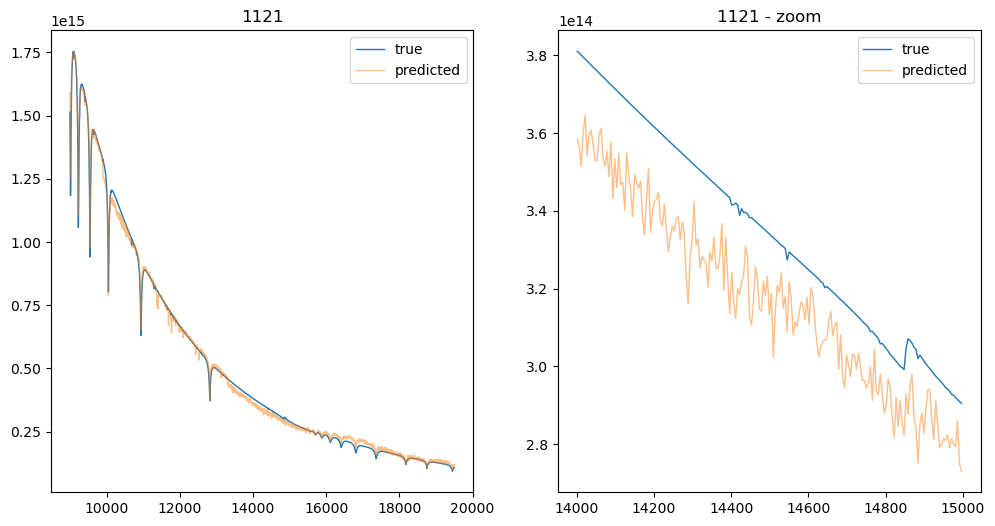

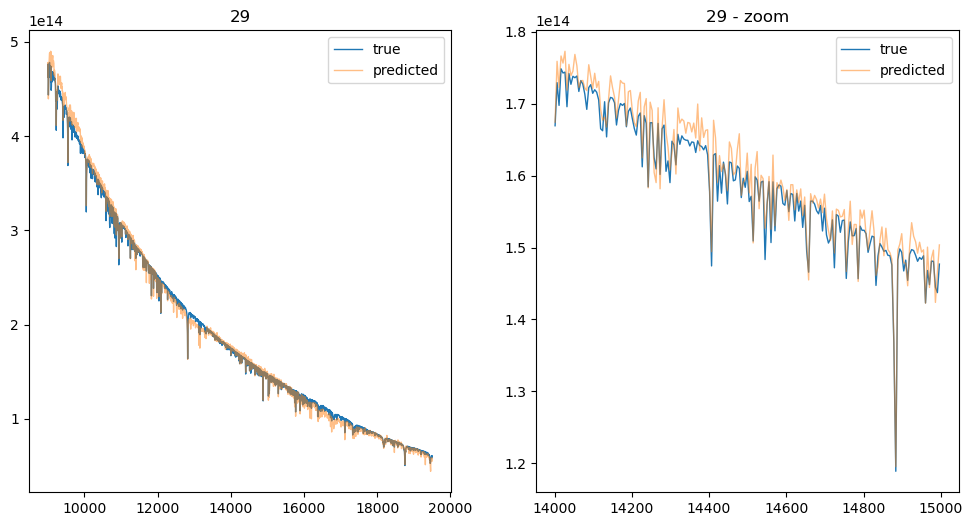

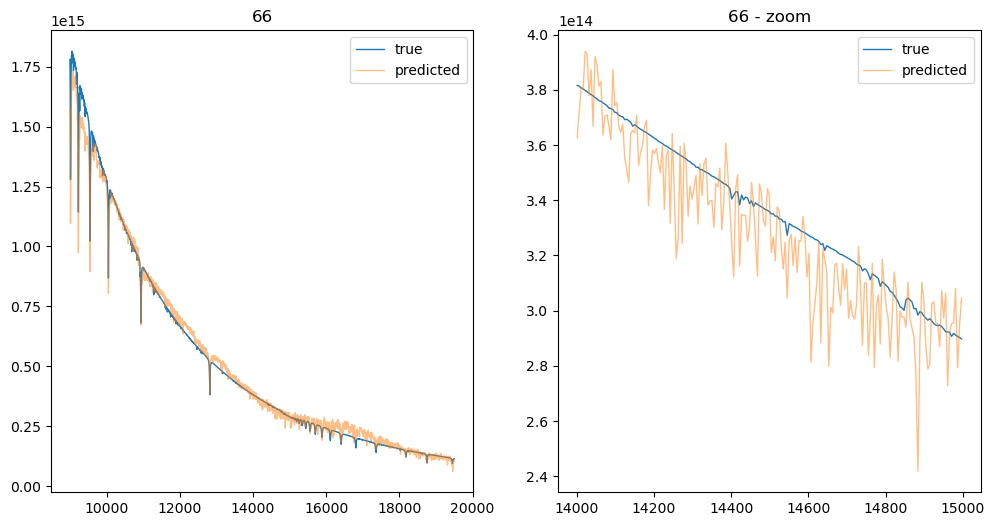

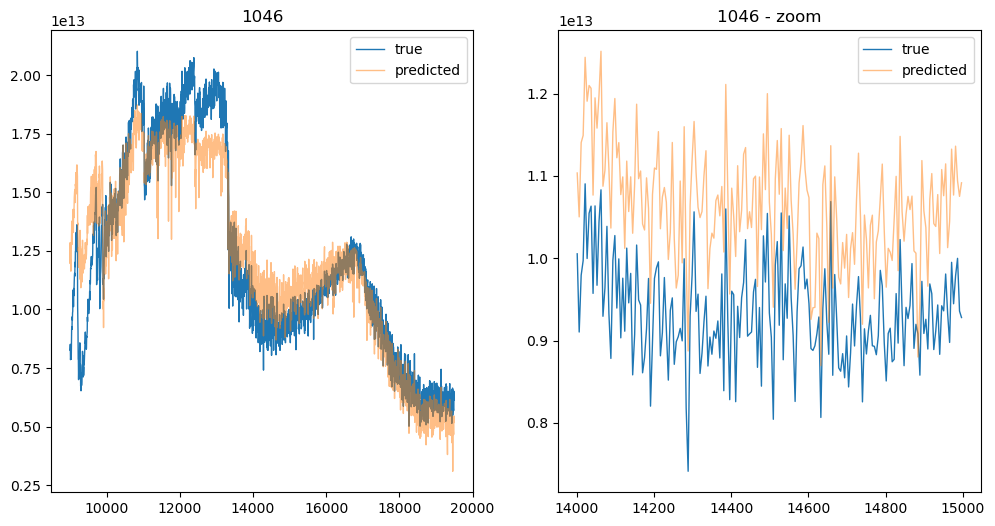

In [40]:
inranges = [(f.min(), f.max()) for f in infeatures.T]
model = PolynomialNN(inranges, fluxes.shape[-1], 20).to(device, tensor_dtype)
model.inscale = model.inscale.to(device, tensor_dtype)
model.inmin = model.inmin.to(device, tensor_dtype)
model.polyarr = model.polyarr.to(device, tensor_dtype)

ds = TensorDataset(infeatures.to(device, tensor_dtype), perfects.to(device, tensor_dtype), infeatures.to(device, tensor_dtype))

nepochs = nperrestart*nrestarts
sched = functools.partial(torch.optim.lr_scheduler.CosineAnnealingWarmRestarts, T_0=nperrestart)
valid, train, lrs, data_split = train_validation(model, 
                                            dataset=ds, 
                                            nepochs=nepochs, 
                                            batch_size=1024, 
                                            lr=lr, 
                                            weight_decay=wd, 
                                            loss_fcn=nn.MSELoss(), 
                                            scheduler_fcn=sched)

plt.figure()
plt.semilogy(*valid, 'o', c='C0', label='validation')
plt.semilogy(*train, '.', c='C1', ms=1, label='training')
plt.legend(loc=0)
plt.twinx()
plt.plot(valid[0], lrs, label='learning rate',c='C2', alpha=.5)
plt.ylabel('learning rate', color='C2')

plot_sample_specs(model, data_split)


mapmean = {tuple([float(v) for v in inf]):m for inf, m in zip(infeatures, fmeans)}
mapstd = {tuple([float(v) for v in inf]):m for inf, m in zip(infeatures, fstds)}
def descaler(y, infeatures):
    key = tuple([float(v) for v in infeatures])
    m = mapmean[key]
    s = mapstd[key]
    return y*s + m
plot_sample_specs(model, data_split, descaler)